# Knowledge Discovery and Data Mining

## Project: Predicting the Price of California Wine
#### Course : CS-513 A

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import plot_confusion_matrix, plot_roc_curve, roc_auc_score
from mlxtend.plotting import category_scatter, plot_learning_curves, plot_decision_regions

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv("Californa_Wine_Production_1980_2020.csv")

In [4]:
data

,Year,CommodityCode,CropName,CountyCode,County,HarvestedAcres,Yield(Unit/Acre),Production,Price(Dollars/Unit),Unit,Value(Dollars)
0,2020,216299,GRAPESWINE,1,Alameda,2530.0,5.14,13000.0,1497.69,Tons,19470000
1,2020,216299,GRAPESWINE,5,Amador,5360.0,2.31,12400.0,1318.31,Tons,16347000
2,2020,216299,GRAPESWINE,9,Calaveras,579.0,3.06,1770.0,1325.99,Tons,2347000
3,2020,216299,GRAPESWINE,11,Colusa,747.0,6.02,4500.0,684.67,Tons,3081000
4,2020,216299,GRAPESWINE,13,ContraCosta,1940.0,4.69,9090.0,751.27,Tons,6829000
...,...,...,...,...,...,...,...,...,...,...,...
1310,1980,216299,GRAPESWINE,95,Solano,1138.0,3.99,4544.0,315.00,TONS,1433300
1311,1980,216299,GRAPESWINE,97,Sonoma,23639.0,3.34,78941.0,506.00,TONS,39982000
1312,1980,216299,GRAPESWINE,99,Stanislaus,17950.0,8.80,157900.0,183.00,TONS,28848000
1313,1980,216299,GRAPESWINE,107,Tulare,15159.0,8.88,134600.0,170.00,TONS,22902000


In [5]:
data.rename(columns = {'Yield(Unit/Acre)':'Yield', 'Price(Dollars/Unit)':'Price', 'Value(Dollars)':'Value'}, inplace = True)

In [6]:
data.Unit = "TONS"

In [7]:
data

,Year,CommodityCode,CropName,CountyCode,County,HarvestedAcres,Yield,Production,Price,Unit,Value
0,2020,216299,GRAPESWINE,1,Alameda,2530.0,5.14,13000.0,1497.69,TONS,19470000
1,2020,216299,GRAPESWINE,5,Amador,5360.0,2.31,12400.0,1318.31,TONS,16347000
2,2020,216299,GRAPESWINE,9,Calaveras,579.0,3.06,1770.0,1325.99,TONS,2347000
3,2020,216299,GRAPESWINE,11,Colusa,747.0,6.02,4500.0,684.67,TONS,3081000
4,2020,216299,GRAPESWINE,13,ContraCosta,1940.0,4.69,9090.0,751.27,TONS,6829000
...,...,...,...,...,...,...,...,...,...,...,...
1310,1980,216299,GRAPESWINE,95,Solano,1138.0,3.99,4544.0,315.00,TONS,1433300
1311,1980,216299,GRAPESWINE,97,Sonoma,23639.0,3.34,78941.0,506.00,TONS,39982000
1312,1980,216299,GRAPESWINE,99,Stanislaus,17950.0,8.80,157900.0,183.00,TONS,28848000
1313,1980,216299,GRAPESWINE,107,Tulare,15159.0,8.88,134600.0,170.00,TONS,22902000


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1315 entries, 0 to 1314
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Year            1315 non-null   int64  
 1   CommodityCode   1315 non-null   int64  
 2   CropName        1315 non-null   object 
 3   CountyCode      1315 non-null   int64  
 4   County          1315 non-null   object 
 5   HarvestedAcres  1302 non-null   float64
 6   Yield           1266 non-null   float64
 7   Production      1278 non-null   float64
 8   Price           1278 non-null   float64
 9   Unit            1315 non-null   object 
 10  Value           1315 non-null   int64  
dtypes: float64(4), int64(4), object(3)
memory usage: 113.1+ KB


In [9]:
data.describe()

,Year,CommodityCode,CountyCode,HarvestedAcres,Yield,Production,Price,Value
count,1315.000000,1315.0,1315.000000,1302.000000,1266.000000,1.278000e+03,1278.000000,1.315000e+03
mean,2001.171103,216299.0,59.051711,14546.443164,5.176288,1.023638e+05,928.027363,5.961252e+07
std,11.751631,0.0,31.083778,20576.581018,3.267309,1.711560e+05,1244.949783,1.237376e+08
min,1980.000000,216299.0,1.000000,3.000000,0.060000,2.300000e+01,74.000000,1.150000e+04
25%,1991.000000,216299.0,33.000000,805.750000,2.940000,3.259750e+03,335.827500,1.600500e+06
50%,2002.000000,216299.0,61.000000,3699.000000,4.040000,1.740000e+04,723.500000,1.220210e+07
75%,2011.000000,216299.0,83.000000,23884.500000,7.185000,1.298860e+05,1236.887500,6.340450e+07
max,2020.000000,216299.0,115.000000,128613.000000,25.000000,1.040100e+06,36342.070000,2.030002e+09


In [10]:
data.describe(include='all')

,Year,CommodityCode,CropName,CountyCode,County,HarvestedAcres,Yield,Production,Price,Unit,Value
count,1315.000000,1315.0,1315,1315.000000,1315,1302.000000,1266.000000,1.278000e+03,1278.000000,1315,1.315000e+03
unique,NaN,NaN,1,NaN,42,NaN,NaN,NaN,NaN,1,NaN
top,NaN,NaN,GRAPESWINE,NaN,Alameda,NaN,NaN,NaN,NaN,TONS,NaN
freq,NaN,NaN,1315,NaN,41,NaN,NaN,NaN,NaN,1315,NaN
mean,2001.171103,216299.0,NaN,59.051711,NaN,14546.443164,5.176288,1.023638e+05,928.027363,NaN,5.961252e+07
std,11.751631,0.0,NaN,31.083778,NaN,20576.581018,3.267309,1.711560e+05,1244.949783,NaN,1.237376e+08
min,1980.000000,216299.0,NaN,1.000000,NaN,3.000000,0.060000,2.300000e+01,74.000000,NaN,1.150000e+04
25%,1991.000000,216299.0,NaN,33.000000,NaN,805.750000,2.940000,3.259750e+03,335.827500,NaN,1.600500e+06
50%,2002.000000,216299.0,NaN,61.000000,NaN,3699.000000,4.040000,1.740000e+04,723.500000,NaN,1.220210e+07
75%,2011.000000,216299.0,NaN,83.000000,NaN,23884.500000,7.185000,1.298860e+05,1236.887500,NaN,6.340450e+07


In [11]:
data.dtypes

Year                int64
CommodityCode       int64
CropName           object
CountyCode          int64
County             object
HarvestedAcres    float64
Yield             float64
Production        float64
Price             float64
Unit               object
Value               int64
dtype: object

In [12]:
data = data.drop(columns=['CommodityCode','CropName','Unit','Value'])

In [13]:
data.duplicated().any()

False

In [14]:
data.duplicated().value_counts()

False    1315
dtype: int64

In [15]:
data.isnull().sum()

Year               0
CountyCode         0
County             0
HarvestedAcres    13
Yield             49
Production        37
Price             37
dtype: int64

In [16]:
data.columns[data.isnull().any()]

Index(['HarvestedAcres', 'Yield', 'Production', 'Price'], dtype='object')

In [17]:
data.isnull().value_counts()

Year   CountyCode  County  HarvestedAcres  Yield  Production  Price
False  False       False   False           False  False       False    1266
                                           True   True        True       36
                           True            True   False       False      12
                                                  True        True        1
dtype: int64

In [18]:
data[data.HarvestedAcres.isna()].sort_values(['County','Year'])

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
1225,1983,57,Nevada,NaN,NaN,23.0,500.0
1193,1984,57,Nevada,NaN,NaN,46.0,496.0
1163,1985,57,Nevada,NaN,NaN,62.0,405.0
1134,1986,57,Nevada,NaN,NaN,125.0,435.0
1103,1987,57,Nevada,NaN,NaN,238.0,465.0
1072,1988,57,Nevada,NaN,NaN,223.0,502.0
1043,1989,57,Nevada,NaN,NaN,473.0,656.0
1015,1990,57,Nevada,NaN,NaN,527.0,928.0
592,2004,81,SanMateo,NaN,NaN,NaN,NaN
760,1999,105,Trinity,NaN,NaN,140.0,1204.0


In [19]:
data[data.Yield.isna()].sort_values(['County','Year'])

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
1225,1983,57,Nevada,NaN,NaN,23.0,500.0
1193,1984,57,Nevada,NaN,NaN,46.0,496.0
1163,1985,57,Nevada,NaN,NaN,62.0,405.0
1134,1986,57,Nevada,NaN,NaN,125.0,435.0
1103,1987,57,Nevada,NaN,NaN,238.0,465.0
1072,1988,57,Nevada,NaN,NaN,223.0,502.0
1043,1989,57,Nevada,NaN,NaN,473.0,656.0
1015,1990,57,Nevada,NaN,NaN,527.0,928.0
16,2020,57,Nevada,408.0,NaN,NaN,NaN
936,1993,81,SanMateo,48.0,NaN,NaN,NaN


In [20]:
data[data.Production.isna()].sort_values(['County','Year'])

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
16,2020,57,Nevada,408.0,NaN,NaN,NaN
936,1993,81,SanMateo,48.0,NaN,NaN,NaN
907,1994,81,SanMateo,54.0,NaN,NaN,NaN
877,1995,81,SanMateo,56.0,NaN,NaN,NaN
848,1996,81,SanMateo,56.0,NaN,NaN,NaN
819,1997,81,SanMateo,52.0,NaN,NaN,NaN
786,1998,81,SanMateo,54.0,NaN,NaN,NaN
754,1999,81,SanMateo,40.0,NaN,NaN,NaN
723,2000,81,SanMateo,45.0,NaN,NaN,NaN
692,2001,81,SanMateo,44.0,NaN,NaN,NaN


In [21]:
data[data.Price.isna()].sort_values(['County','Year'])

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
16,2020,57,Nevada,408.0,NaN,NaN,NaN
936,1993,81,SanMateo,48.0,NaN,NaN,NaN
907,1994,81,SanMateo,54.0,NaN,NaN,NaN
877,1995,81,SanMateo,56.0,NaN,NaN,NaN
848,1996,81,SanMateo,56.0,NaN,NaN,NaN
819,1997,81,SanMateo,52.0,NaN,NaN,NaN
786,1998,81,SanMateo,54.0,NaN,NaN,NaN
754,1999,81,SanMateo,40.0,NaN,NaN,NaN
723,2000,81,SanMateo,45.0,NaN,NaN,NaN
692,2001,81,SanMateo,44.0,NaN,NaN,NaN


In [22]:
data[data['County'] == 'Nevada']

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
16,2020,57,Nevada,408.0,NaN,NaN,NaN
53,2019,57,Nevada,416.0,3.92,1630.0,1564.42
91,2018,57,Nevada,416.0,4.52,1880.0,1284.57
128,2017,57,Nevada,416.0,3.65,1520.0,1287.50
164,2016,57,Nevada,417.0,3.33,1390.0,1386.33
200,2015,57,Nevada,352.0,1.87,659.0,1349.01
234,2014,57,Nevada,342.0,3.86,1320.0,1341.67
269,2013,57,Nevada,424.0,2.92,1240.0,1521.77
305,2012,57,Nevada,312.0,2.75,858.0,1393.94
341,2011,57,Nevada,343.0,5.19,1780.0,1101.12


In [23]:
data[data['County'] == 'SanMateo']

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
25,2020,81,SanMateo,176.0,NaN,NaN,NaN
62,2019,81,SanMateo,181.0,NaN,NaN,NaN
100,2018,81,SanMateo,126.0,NaN,NaN,NaN
137,2017,81,SanMateo,164.0,NaN,NaN,NaN
173,2016,81,SanMateo,152.0,NaN,NaN,NaN
209,2015,81,SanMateo,165.0,NaN,NaN,NaN
243,2014,81,SanMateo,154.0,NaN,NaN,NaN
278,2013,81,SanMateo,153.0,NaN,NaN,NaN
314,2012,81,SanMateo,131.0,NaN,NaN,NaN
350,2011,81,SanMateo,135.0,NaN,NaN,NaN


In [24]:
data[data['County'] == 'Trinity']

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
71,2019,105,Trinity,44.0,1.93,85.0,1729.41
108,2018,105,Trinity,44.0,1.93,85.0,1729.41
144,2017,105,Trinity,44.0,1.93,85.0,1729.41
180,2016,105,Trinity,44.0,1.93,85.0,1729.41
285,2013,105,Trinity,114.0,2.33,266.0,1214.29
321,2012,105,Trinity,114.0,2.33,266.0,1214.29
357,2011,105,Trinity,114.0,2.33,266.0,1214.29
393,2010,105,Trinity,114.0,2.33,266.0,1214.29
428,2009,105,Trinity,114.0,NaN,NaN,NaN
462,2008,105,Trinity,114.0,NaN,NaN,NaN


In [25]:
data.dropna(inplace=True)

In [26]:
data.isnull().sum()

Year              0
CountyCode        0
County            0
HarvestedAcres    0
Yield             0
Production        0
Price             0
dtype: int64

In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1266 entries, 0 to 1314
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Year            1266 non-null   int64  
 1   CountyCode      1266 non-null   int64  
 2   County          1266 non-null   object 
 3   HarvestedAcres  1266 non-null   float64
 4   Yield           1266 non-null   float64
 5   Production      1266 non-null   float64
 6   Price           1266 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 79.1+ KB


<b>Discretizing the data into classes. </b>

In [28]:
data

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
0,2020,1,Alameda,2530.0,5.14,13000.0,1497.69
1,2020,5,Amador,5360.0,2.31,12400.0,1318.31
2,2020,9,Calaveras,579.0,3.06,1770.0,1325.99
3,2020,11,Colusa,747.0,6.02,4500.0,684.67
4,2020,13,ContraCosta,1940.0,4.69,9090.0,751.27
...,...,...,...,...,...,...,...
1310,1980,95,Solano,1138.0,3.99,4544.0,315.00
1311,1980,97,Sonoma,23639.0,3.34,78941.0,506.00
1312,1980,99,Stanislaus,17950.0,8.80,157900.0,183.00
1313,1980,107,Tulare,15159.0,8.88,134600.0,170.00


In [29]:
price_data = data.Price

In [30]:
# len(price_data)
price_data.size

1266

In [31]:
price_data.sort_values(ascending=True)

1156       74.00
1155       90.00
1158       94.00
1188       95.00
1185       97.00
          ...   
370      5125.60
127      5287.55
90       5614.05
52       5862.26
522     36342.07
Name: Price, Length: 1266, dtype: float64

In [32]:
data.sort_values('Price')

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price
1156,1985,31,Kings,1117.0,11.90,13292.0,74.00
1155,1985,29,Kern,33255.0,8.48,282000.0,90.00
1158,1985,39,Madera,40100.0,7.54,302354.0,94.00
1188,1984,39,Madera,36010.0,6.87,247389.0,95.00
1185,1984,29,Kern,34861.0,6.95,242160.0,97.00
...,...,...,...,...,...,...,...
370,2010,41,Marin,186.0,1.11,207.0,5125.60
127,2017,55,Napa,43600.0,3.26,142000.0,5287.55
90,2018,55,Napa,43400.0,4.26,185000.0,5614.05
52,2019,55,Napa,44200.0,3.62,160000.0,5862.26


In [33]:
data['Price'].value_counts()

400.00     9
193.00     5
249.00     5
170.00     5
1263.16    5
          ..
1046.00    1
1139.48    1
253.16     1
273.03     1
274.00     1
Name: Price, Length: 1057, dtype: int64

In [34]:
data['Price'].value_counts().sort_index()

74.00       1
90.00       1
94.00       1
95.00       1
97.00       1
           ..
5125.60     1
5287.55     1
5614.05     1
5862.26     1
36342.07    1
Name: Price, Length: 1057, dtype: int64

<AxesSubplot: title={'center': 'Counts'}>

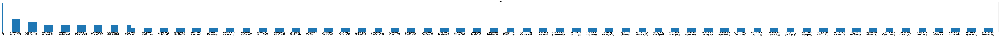

In [35]:
plt.figure(figsize=(200, 6))
price_data.value_counts().plot(kind = 'bar', title = 'Counts')

In [36]:
data['Price_Classification'] = pd.cut(x=data['Price'], bins=[0, 250, 1000, 50000], labels=[0, 1, 2])
data['Price_Categories'] = pd.cut(x=data['Price'], bins=[0, 250, 1000, 50000], labels=["Low", "Medium", "High"])

In [37]:
data.Price_Categories.size

1266

In [38]:
data.Price_Categories.value_counts()

Medium    557
High      496
Low       213
Name: Price_Categories, dtype: int64

(array([0, 1, 2]),
 [Text(0, 0, 'Medium'), Text(1, 0, 'High'), Text(2, 0, 'Low')])

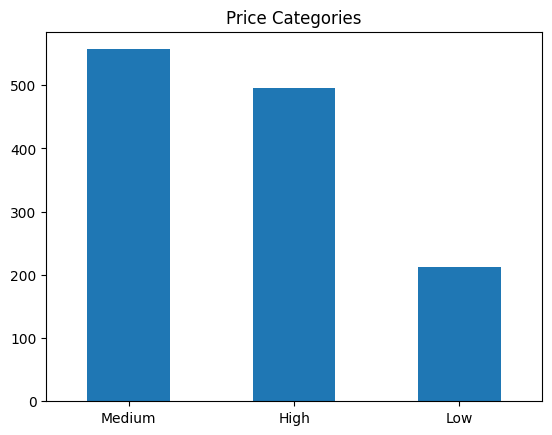

In [39]:
data.Price_Categories.value_counts().plot(kind='bar', title='Price Categories')
plt.xticks(rotation=0)
# plt.grid(True)

<AxesSubplot: title={'center': 'Price Categories'}, ylabel='Price_Categories'>

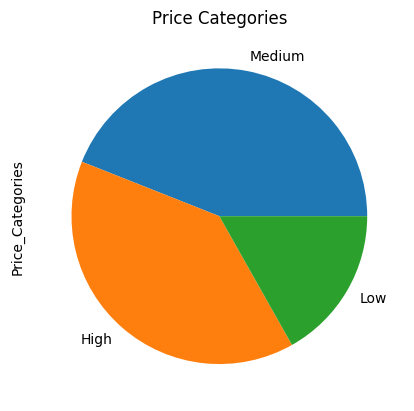

In [40]:
data.Price_Categories.value_counts().plot(kind='pie', title='Price Categories')

In [41]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1266 entries, 0 to 1314
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Year                  1266 non-null   int64   
 1   CountyCode            1266 non-null   int64   
 2   County                1266 non-null   object  
 3   HarvestedAcres        1266 non-null   float64 
 4   Yield                 1266 non-null   float64 
 5   Production            1266 non-null   float64 
 6   Price                 1266 non-null   float64 
 7   Price_Classification  1266 non-null   category
 8   Price_Categories      1266 non-null   category
dtypes: category(2), float64(4), int64(2), object(1)
memory usage: 81.9+ KB


Year (From 1980 to 2020) <br>
CountyCode <br>
County <br>
HarvestedAcres <br>
Yield (Tons/Acres) <br>
Production (Tons) <br>
Price (Dollar/Ton) <br>

$Formula: $ <br>
$Yield = \frac{Production}{HarvestedAcres}$ <br>

<AxesSubplot: >

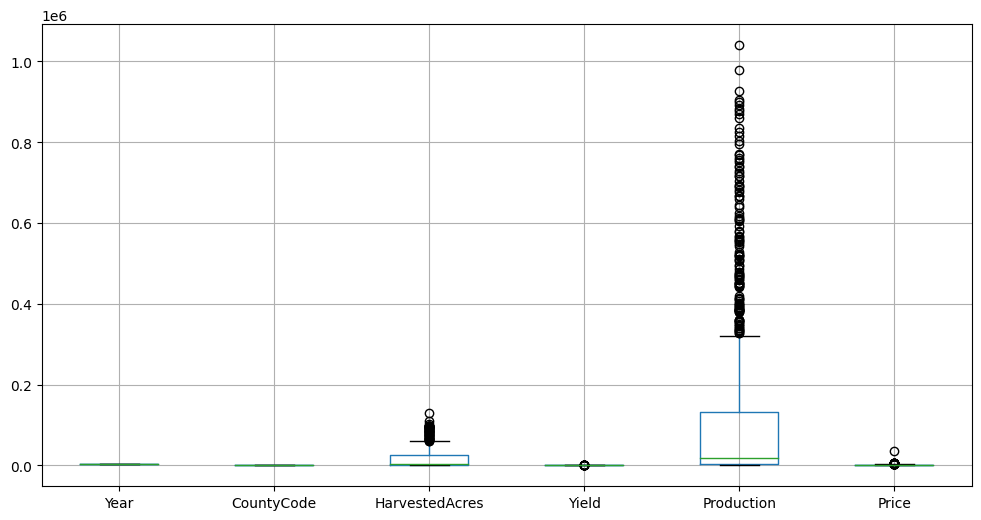

In [42]:
plt.figure(figsize=(12, 6))
data.boxplot()

<AxesSubplot: >

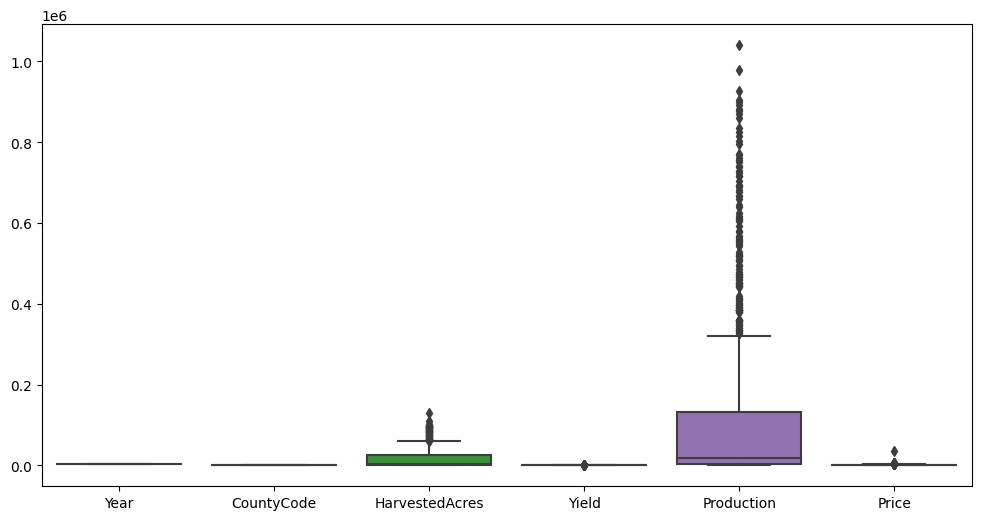

In [43]:
plt.figure(figsize=(12, 6))
sns.boxplot(data)

Year                 AxesSubplot(0.125,0.653529;0.227941x0.226471)
CountyCode        AxesSubplot(0.398529,0.653529;0.227941x0.226471)
HarvestedAcres    AxesSubplot(0.672059,0.653529;0.227941x0.226471)
Yield                AxesSubplot(0.125,0.381765;0.227941x0.226471)
Production        AxesSubplot(0.398529,0.381765;0.227941x0.226471)
Price             AxesSubplot(0.672059,0.381765;0.227941x0.226471)
dtype: object

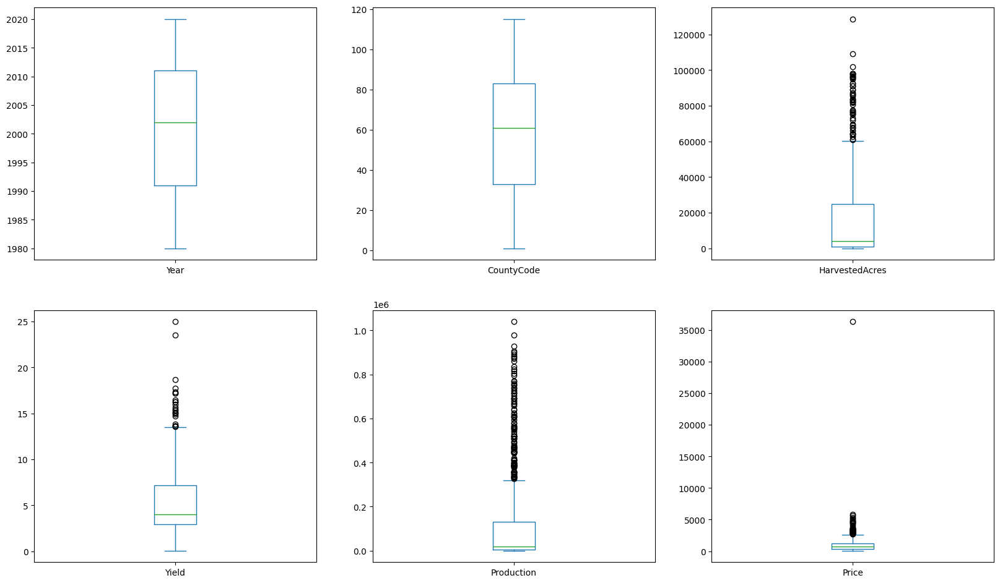

In [44]:
data.plot(kind='box', subplots=True, layout=(3, 3), figsize=(20, 18))

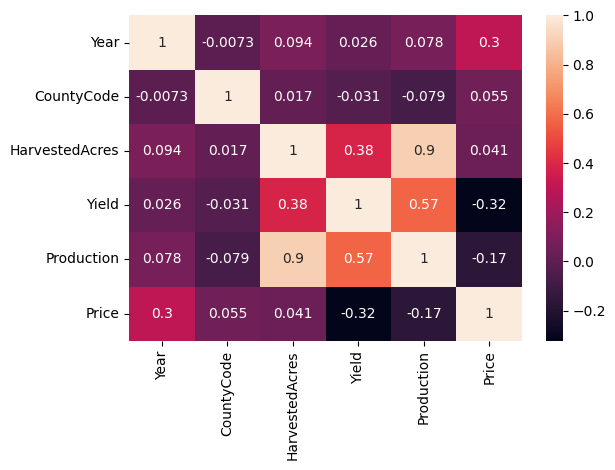

In [45]:
sns.heatmap(data.corr(), annot=True)
plt.tight_layout()

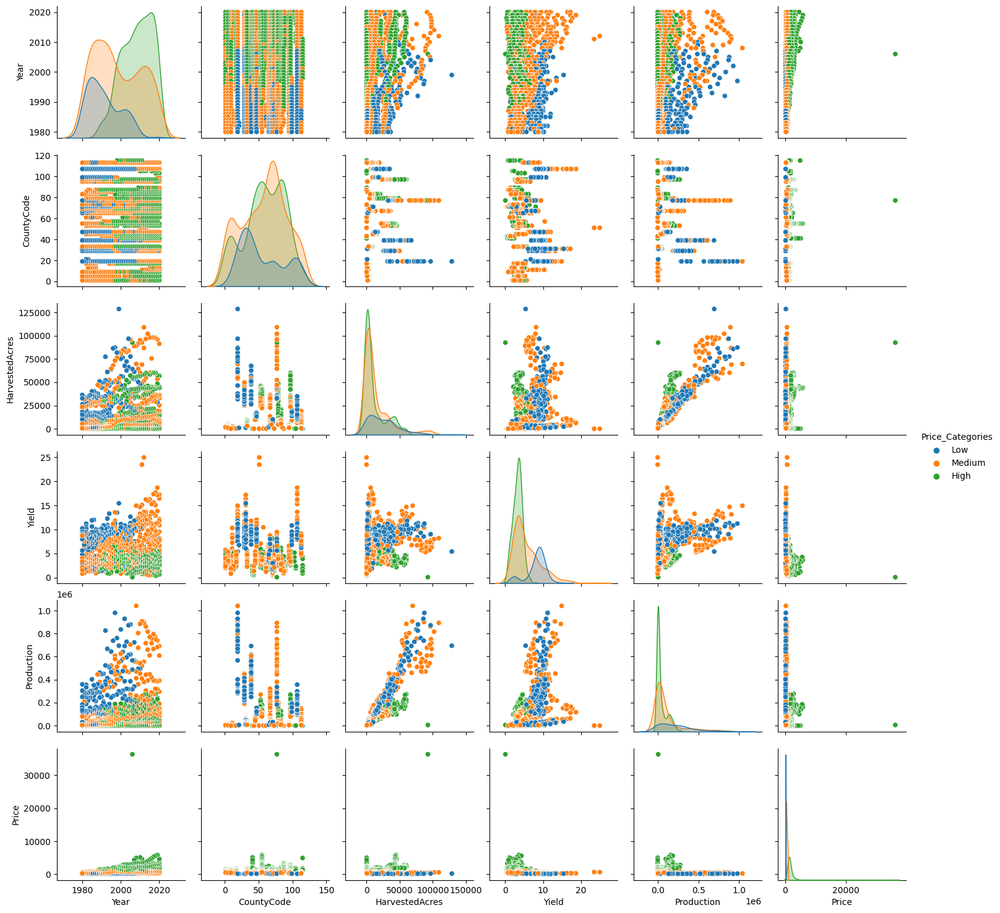

In [46]:
sns.pairplot(data, hue='Price_Categories', palette='tab10')

In [47]:
year_group_df = data.groupby(['Year']).mean()

In [48]:
year_group_df

,CountyCode,HarvestedAcres,Yield,Production,Price
Year,,,,,
1980,58.363636,11648.181818,5.423182,81257.045455,311.181818
1981,58.363636,11361.045455,5.122727,74517.454545,365.909091
1982,56.724138,10141.793103,5.392759,72930.310345,333.379310
1983,56.290323,10020.483871,4.612903,59887.290323,328.935484
1984,57.466667,10810.733333,4.643000,64995.700000,314.333333
1985,58.142857,11566.142857,5.326786,78133.321429,294.035714
1986,56.448276,11338.310345,5.053793,70793.103448,320.862069
1987,57.466667,10421.900000,4.572000,64398.266667,363.933333
1988,60.500000,11734.607143,5.097857,82406.928571,461.928571


In [49]:
year_group_df.index

Int64Index([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
            1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001,
            2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
            2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
           dtype='int64', name='Year')

# Exploratory Data Analysis:

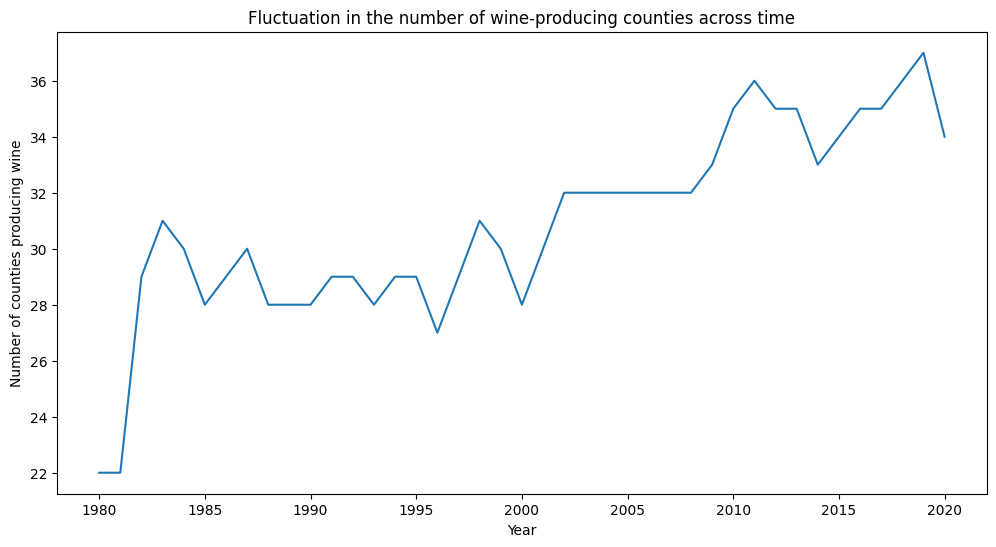

In [50]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=data.groupby(['Year']).count().index, y=data.groupby(['Year']).count()['County'])
plt.ylabel(ylabel='Number of counties producing wine')
plt.title(label='Fluctuation in the number of wine-producing counties across time')
plt.show()

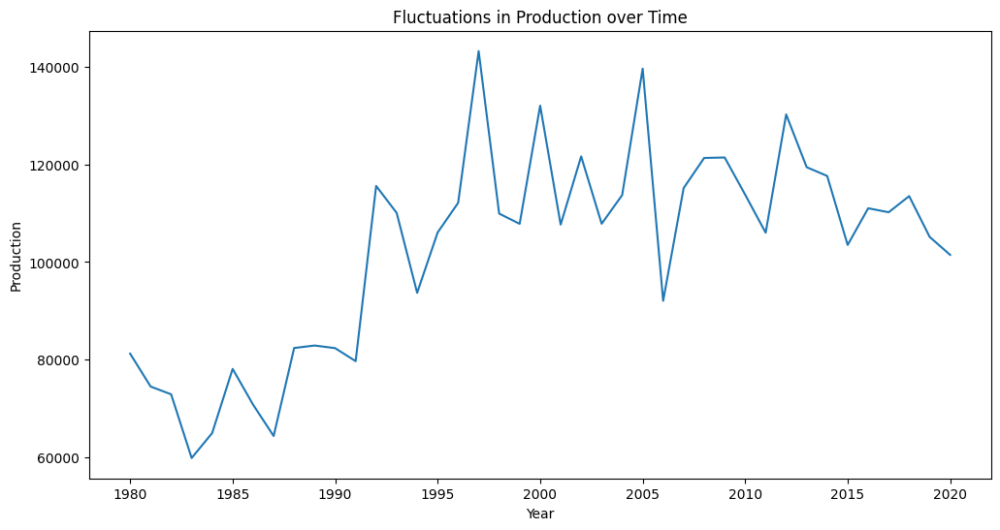

In [51]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=year_group_df.index, y=year_group_df['Production'])
plt.title(label='Fluctuations in Production over Time')
plt.show()

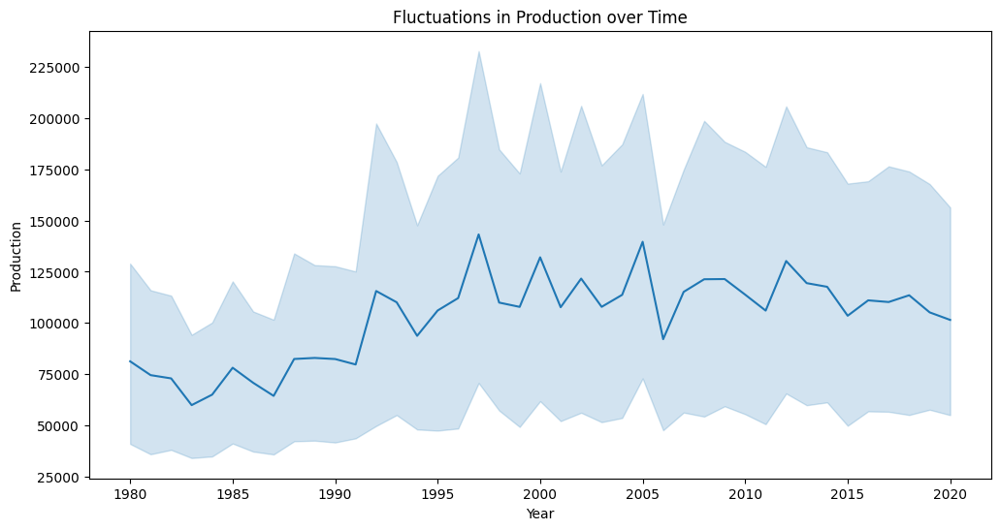

In [52]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='Year', y='Production')
plt.title(label='Fluctuations in Production over Time')
plt.show()

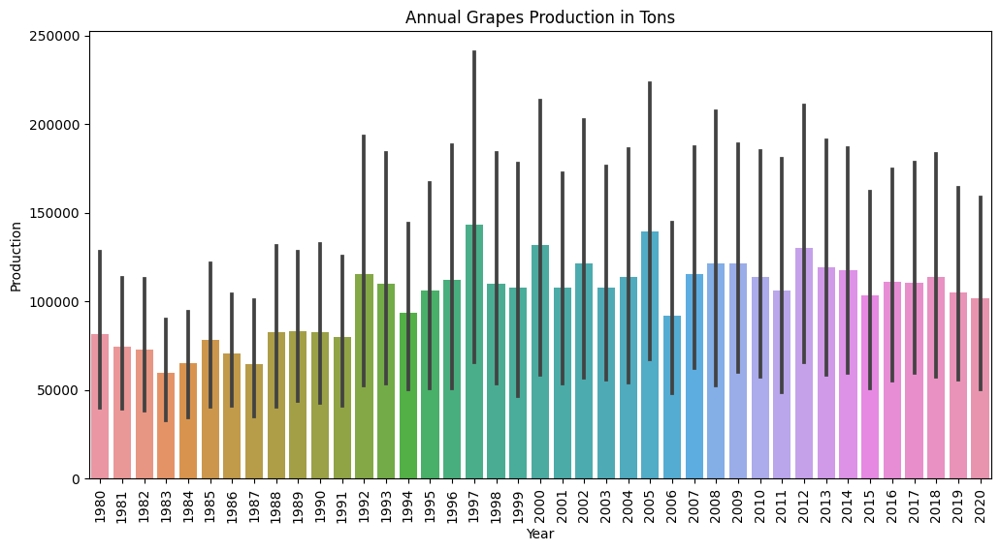

In [53]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='Year', y='Production')
plt.xticks(rotation=90)
plt.title(label='Annual Grapes Production in Tons')
plt.show()

In [54]:
data.sort_values('Production').tail(5)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
293,2012,19,Fresno,86700.0,10.38,900000.0,385.48,1,Medium
329,2011,19,Fresno,68900.0,13.13,905000.0,335.50,1,Medium
640,2002,19,Fresno,85701.0,10.83,928100.0,141.00,0,Low
801,1997,19,Fresno,87220.0,11.22,978930.0,225.00,0,Low
436,2008,19,Fresno,69631.0,14.94,1040100.0,250.93,1,Medium


Text(0.5, 1.0, 'Top Five Wine Production Years')

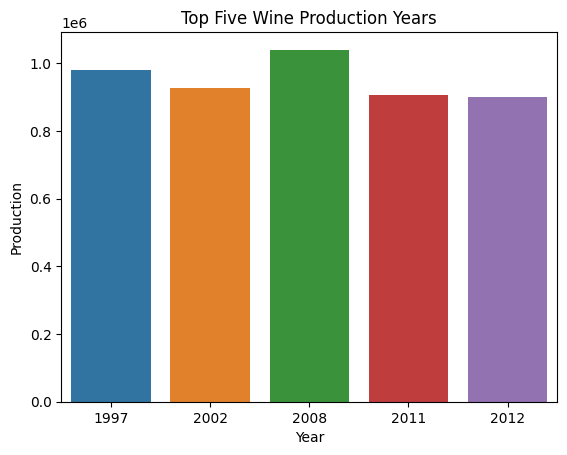

In [55]:
sns.barplot(x='Year', y='Production', data=data.sort_values('Production').tail(5))
plt.title(label='Top Five Wine Production Years')

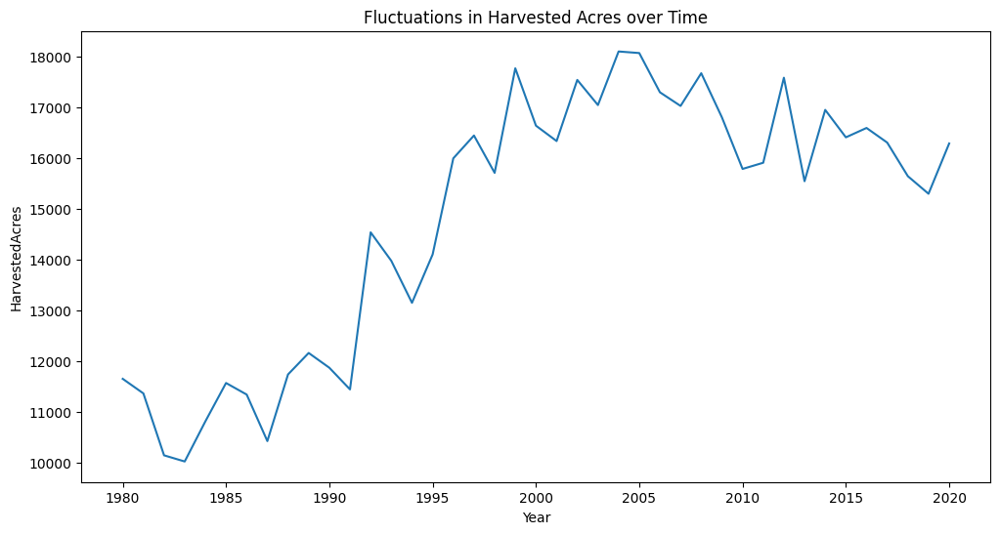

In [56]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=year_group_df.index, y=year_group_df['HarvestedAcres'])
plt.title(label='Fluctuations in Harvested Acres over Time')
plt.show()

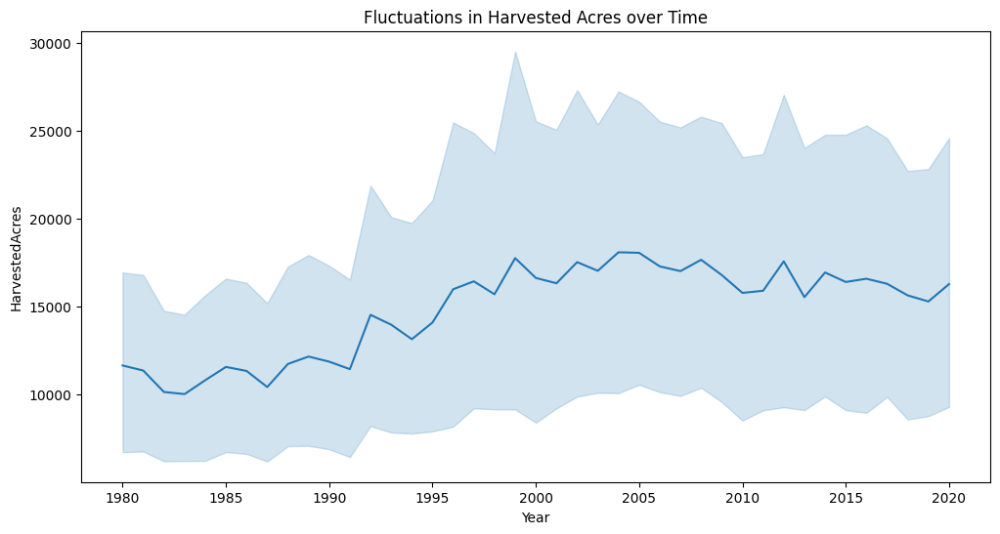

In [57]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='Year', y='HarvestedAcres')
plt.title(label='Fluctuations in Harvested Acres over Time')
plt.show()

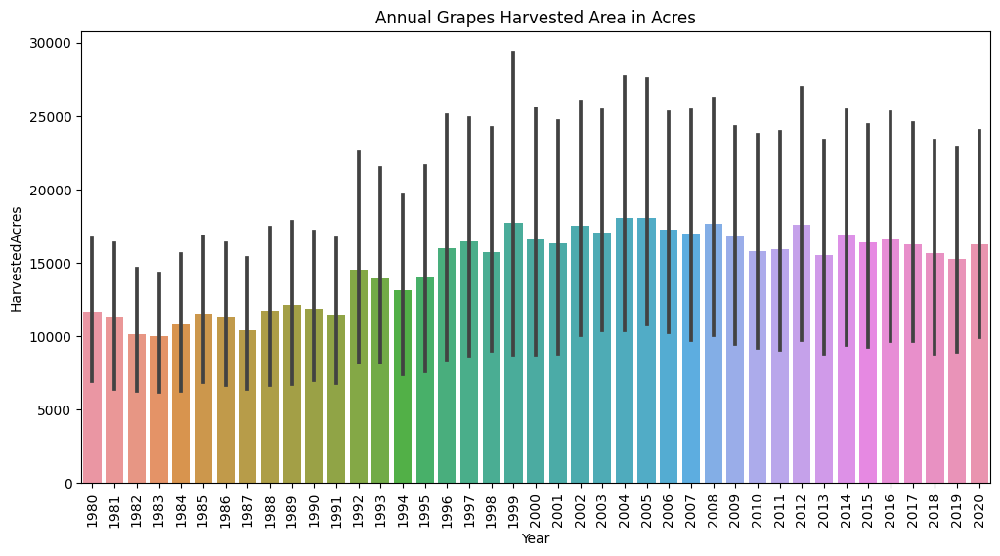

In [58]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='Year', y='HarvestedAcres')
plt.xticks(rotation=90)
plt.title(label='Annual Grapes Harvested Area in Acres')
plt.show()

In [59]:
data.sort_values('HarvestedAcres').tail(5)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
171,2016,77,SanJoaquin,98000.0,7.31,716000.0,594.67,1,Medium
135,2017,77,SanJoaquin,98100.0,6.79,666000.0,593.91,1,Medium
241,2014,77,SanJoaquin,102000.0,8.00,816000.0,590.00,1,Medium
312,2012,77,SanJoaquin,109000.0,8.18,892000.0,605.72,1,Medium
736,1999,19,Fresno,128613.0,5.40,693910.0,237.00,0,Low


Text(0.5, 1.0, 'Top Five Grapes Harvest Years')

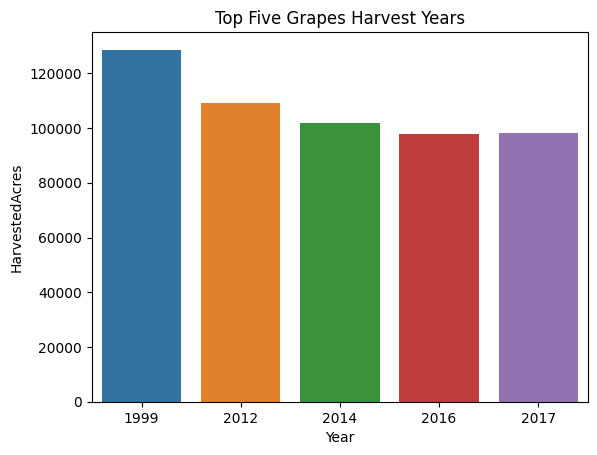

In [60]:
sns.barplot(x='Year', y='HarvestedAcres', data=data.sort_values('HarvestedAcres').tail(5))
plt.title(label='Top Five Grapes Harvest Years')

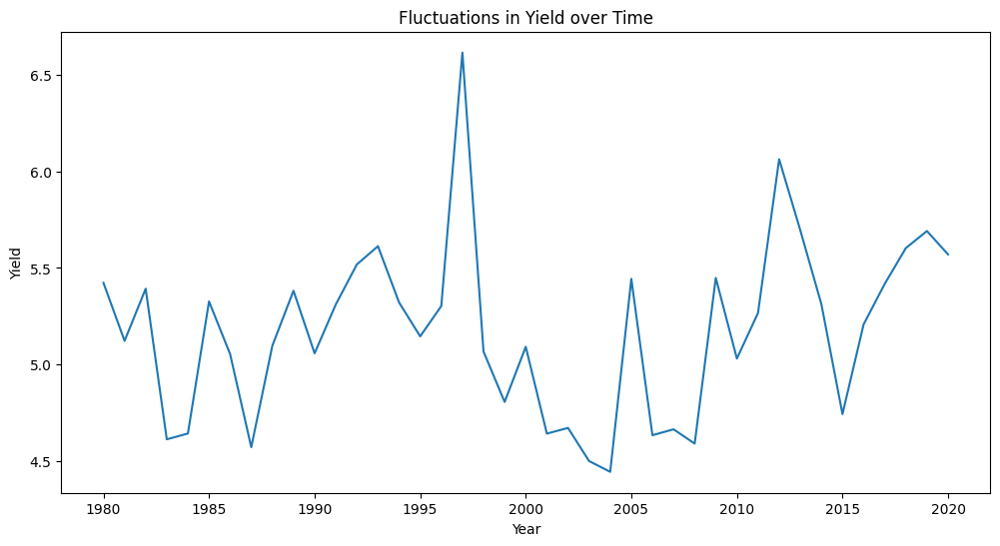

In [61]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=year_group_df.index, y=year_group_df['Yield'])
plt.title(label='Fluctuations in Yield over Time')
plt.show()

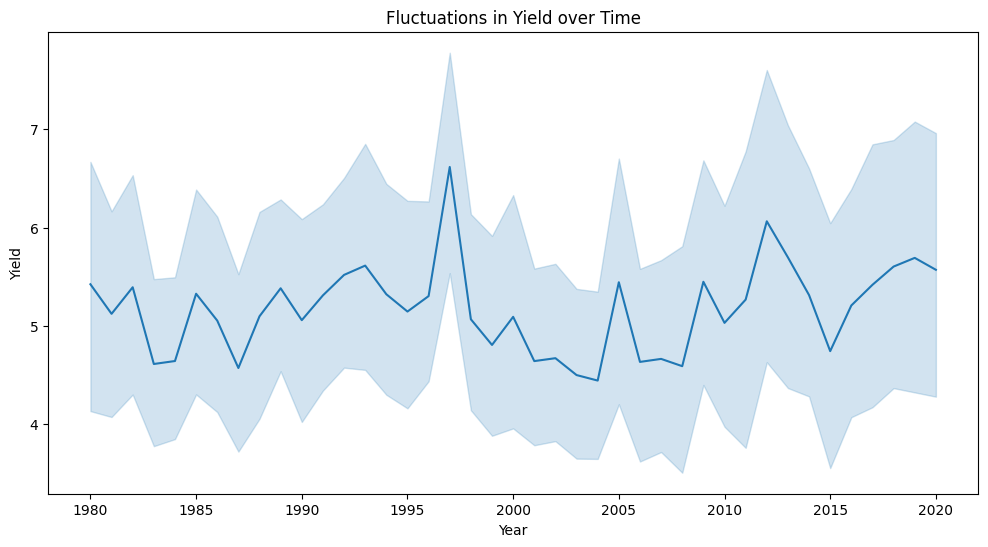

In [62]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='Year', y='Yield')
plt.title(label='Fluctuations in Yield over Time')
plt.show()

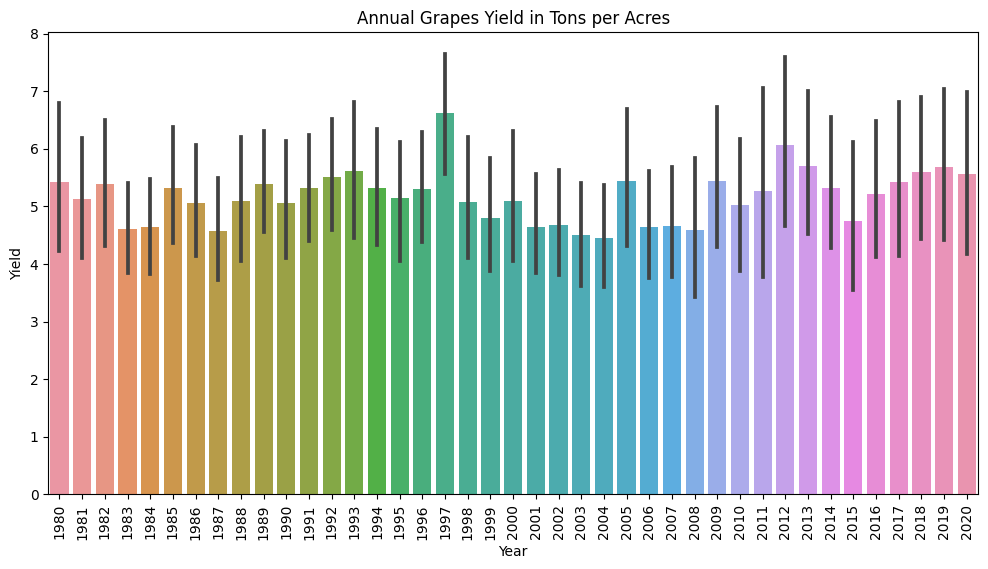

In [63]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='Year', y='Yield')
plt.xticks(rotation=90)
plt.title(label='Annual Grapes Yield in Tons per Acres')
plt.show()

In [64]:
data.sort_values('Yield').tail(5)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
145,2017,107,Tulare,9450.0,17.35,164000.0,308.00,1,Medium
109,2018,107,Tulare,8410.0,17.72,149000.0,314.00,1,Medium
72,2019,107,Tulare,6260.0,18.69,117000.0,290.00,1,Medium
338,2011,51,Mono,4.0,23.50,94.0,670.21,1,Medium
302,2012,51,Mono,3.0,25.00,75.0,653.33,1,Medium


Text(0.5, 1.0, 'Top Five Wine Yield Years')

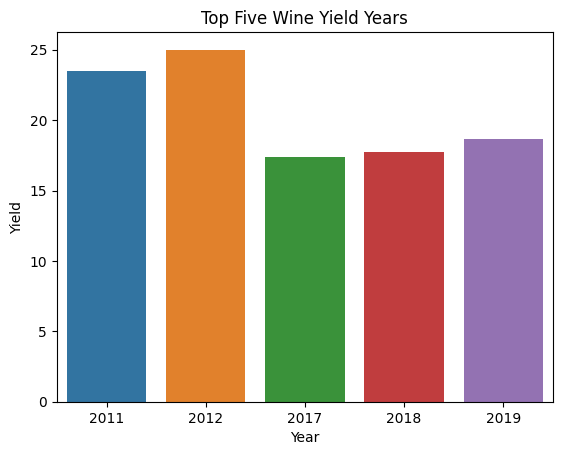

In [65]:
sns.barplot(x='Year', y='Yield', data=data.sort_values('Yield').tail(5))
plt.title(label='Top Five Wine Yield Years')

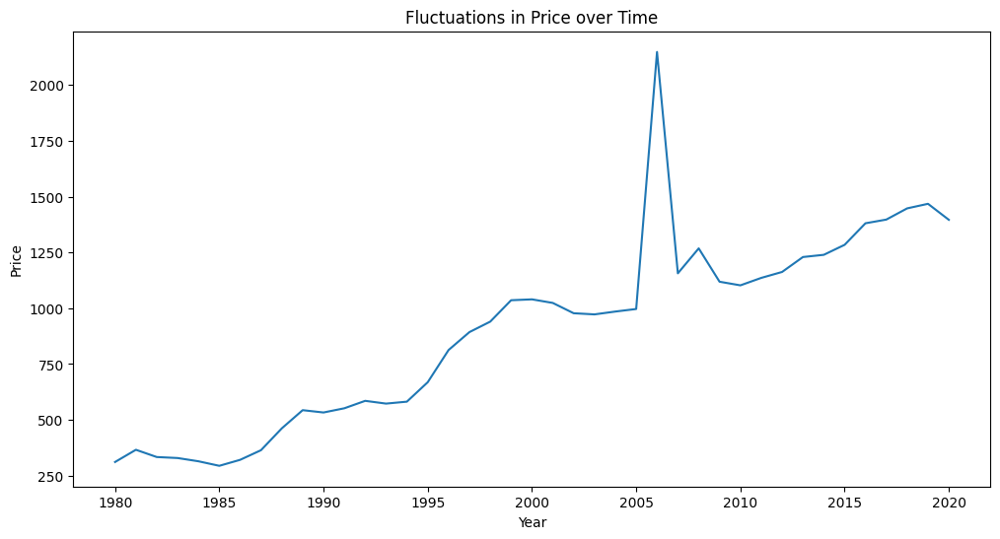

In [66]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=year_group_df.index, y=year_group_df['Price'])
plt.title(label='Fluctuations in Price over Time')
plt.show()

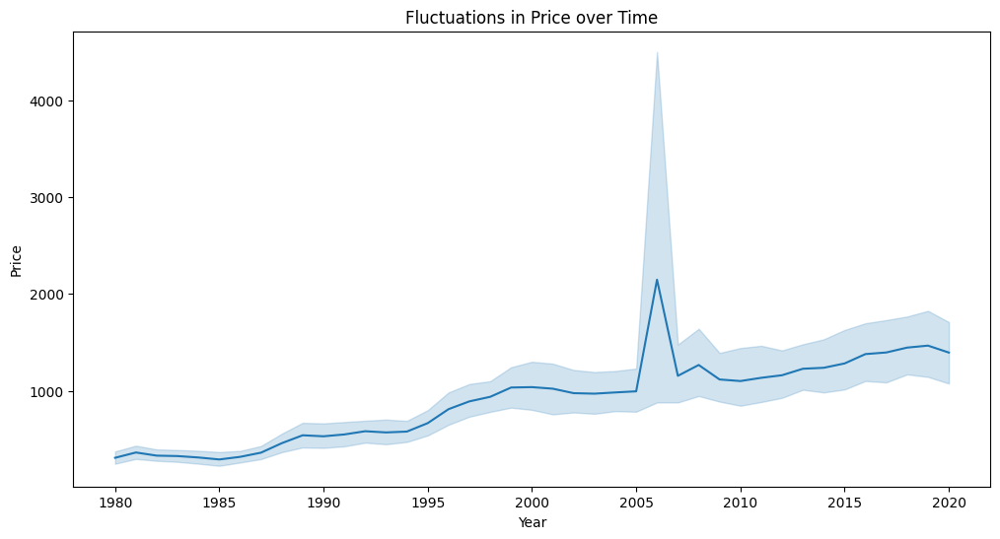

In [67]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='Year', y='Price')
plt.title(label='Fluctuations in Price over Time')
plt.show()

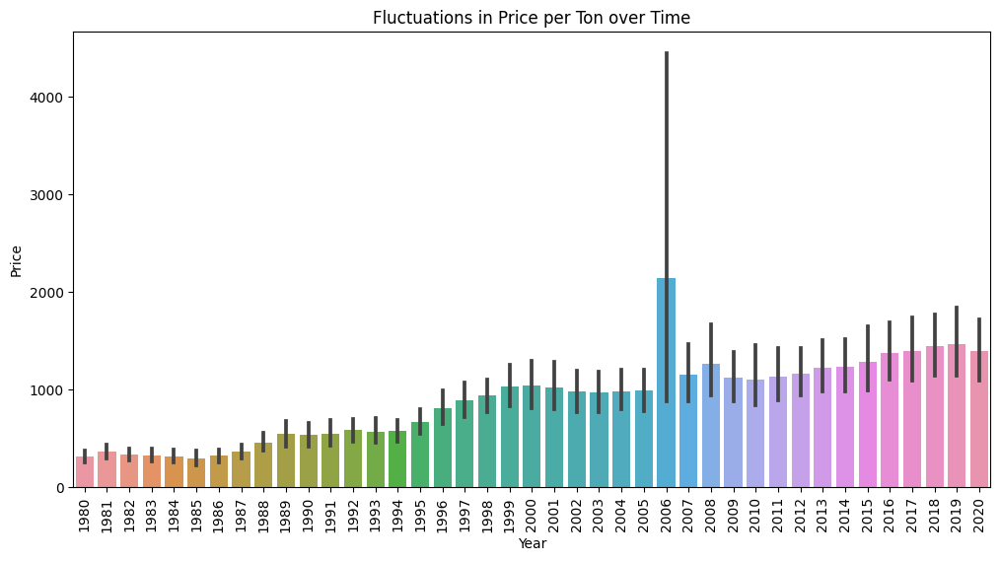

In [68]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='Year', y='Price')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in Price per Ton over Time')
plt.show()

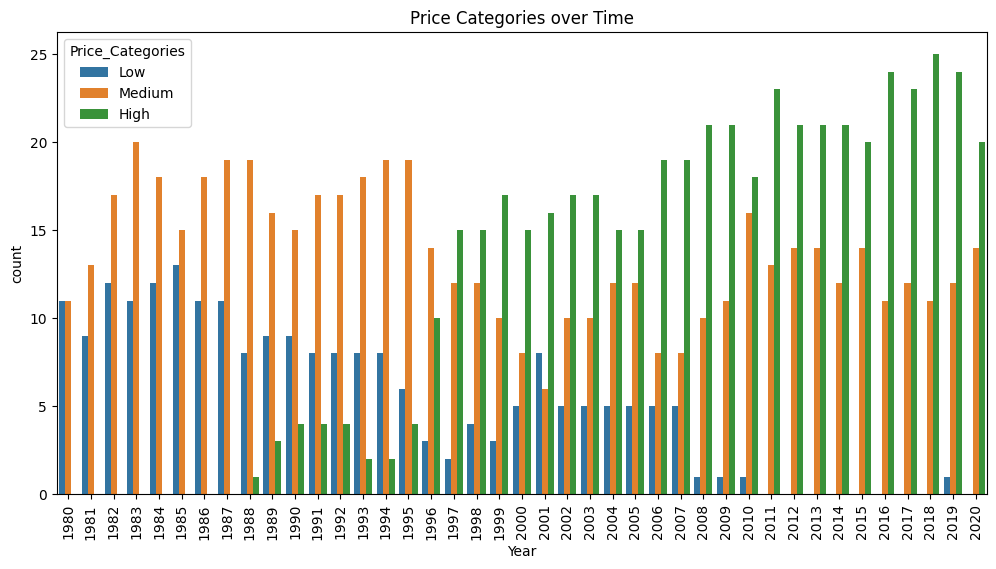

In [69]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Year', hue='Price_Categories', data=data)
plt.xticks(rotation=90)
plt.title(label='Price Categories over Time')
plt.show()

In [70]:
import plotly.express as px
fig = px.line(data, x='Year', y='Price', color='Price_Categories', symbol="Price_Categories")
fig.show()

In [71]:
data.sort_values('Price').tail(5)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
370,2010,41,Marin,186.0,1.11,207.0,5125.60,2,High
127,2017,55,Napa,43600.0,3.26,142000.0,5287.55,2,High
90,2018,55,Napa,43400.0,4.26,185000.0,5614.05,2,High
52,2019,55,Napa,44200.0,3.62,160000.0,5862.26,2,High
522,2006,77,SanJoaquin,92501.0,0.06,5610.0,36342.07,2,High


Text(0.5, 1.0, 'Top Five Wine Price Years')

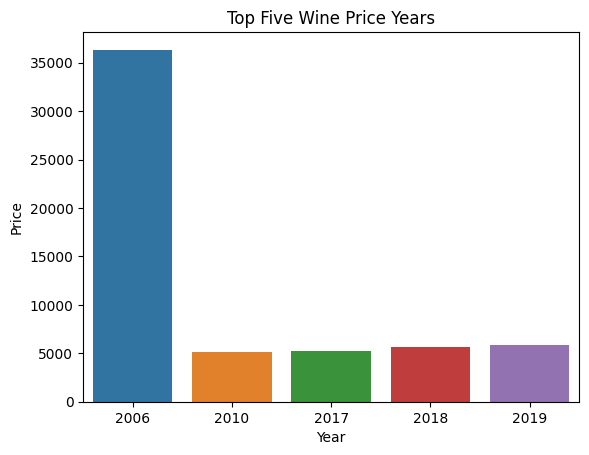

In [72]:
sns.barplot(x='Year', y='Price', data=data.sort_values('Price').tail(5))
plt.title(label='Top Five Wine Price Years')

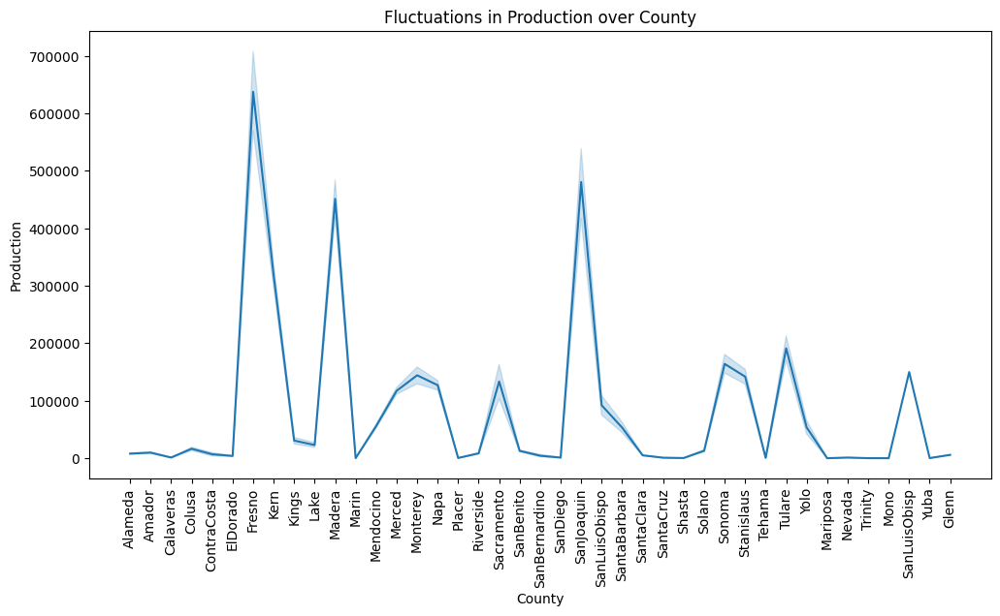

In [73]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='County', y='Production')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in Production over County')
plt.show()

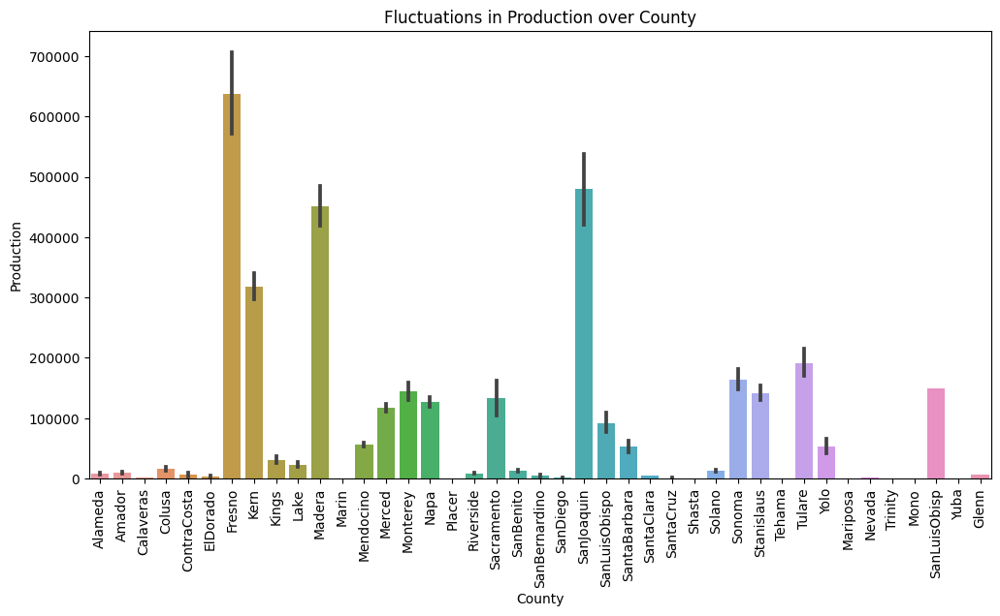

In [74]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='County', y='Production')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in Production over County')
plt.show()

In [75]:
data.sort_values('Production').tail(1)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
436,2008,19,Fresno,69631.0,14.94,1040100.0,250.93,1,Medium


Text(0.5, 1.0, 'Top Wine Production County')

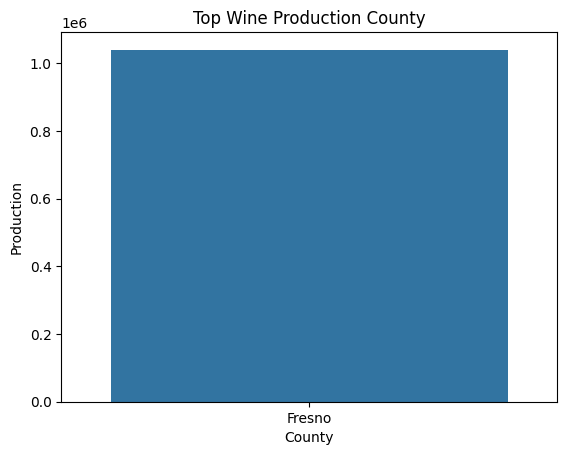

In [76]:
sns.barplot(x='County', y='Production', data=data.sort_values('Production').tail(1))
plt.title(label='Top Wine Production County')

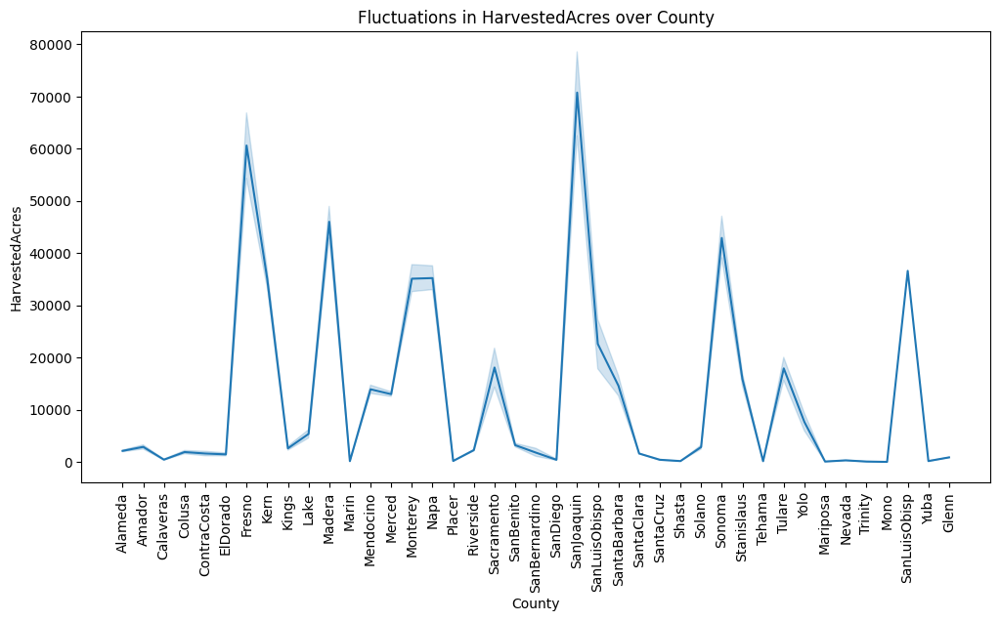

In [77]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='County', y='HarvestedAcres')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in HarvestedAcres over County')
plt.show()

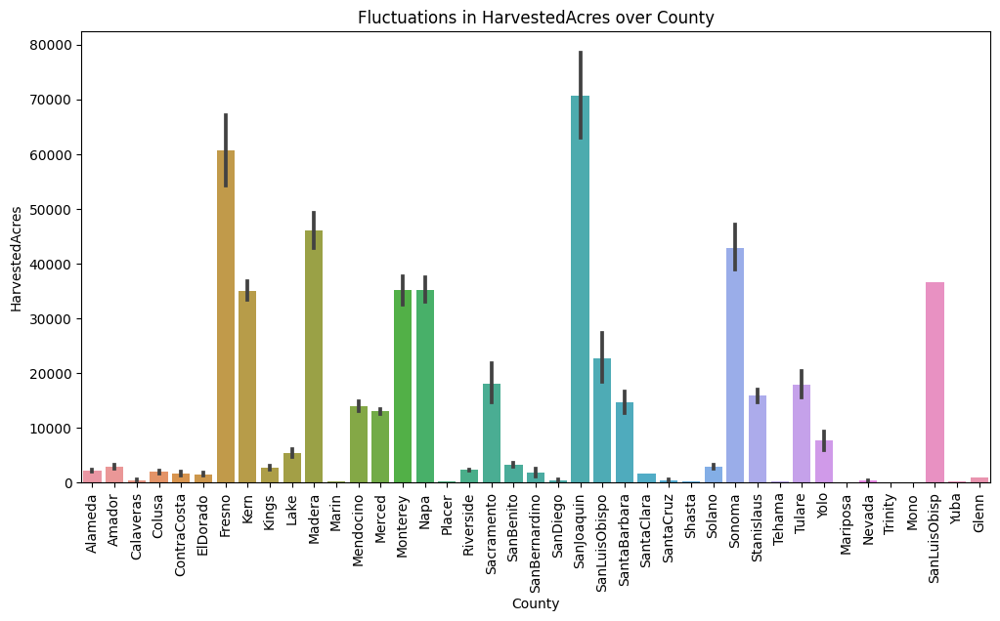

In [78]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='County', y='HarvestedAcres')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in HarvestedAcres over County')
plt.show()

In [79]:
data.sort_values('HarvestedAcres').tail(1)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
736,1999,19,Fresno,128613.0,5.4,693910.0,237.0,0,Low


Text(0.5, 1.0, 'Top Grapes Harvest County')

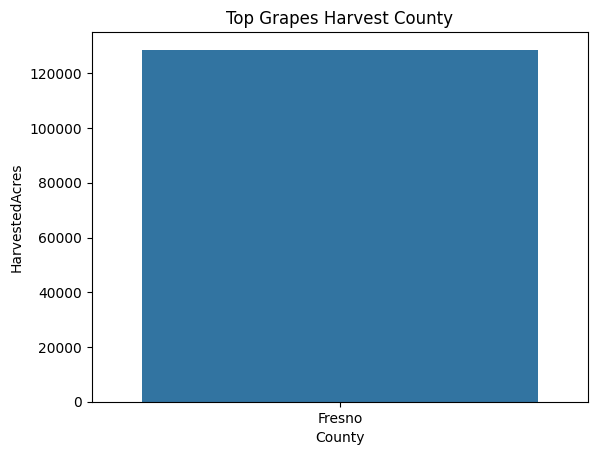

In [80]:
sns.barplot(x='County', y='HarvestedAcres', data=data.sort_values('HarvestedAcres').tail(1))
plt.title(label='Top Grapes Harvest County')

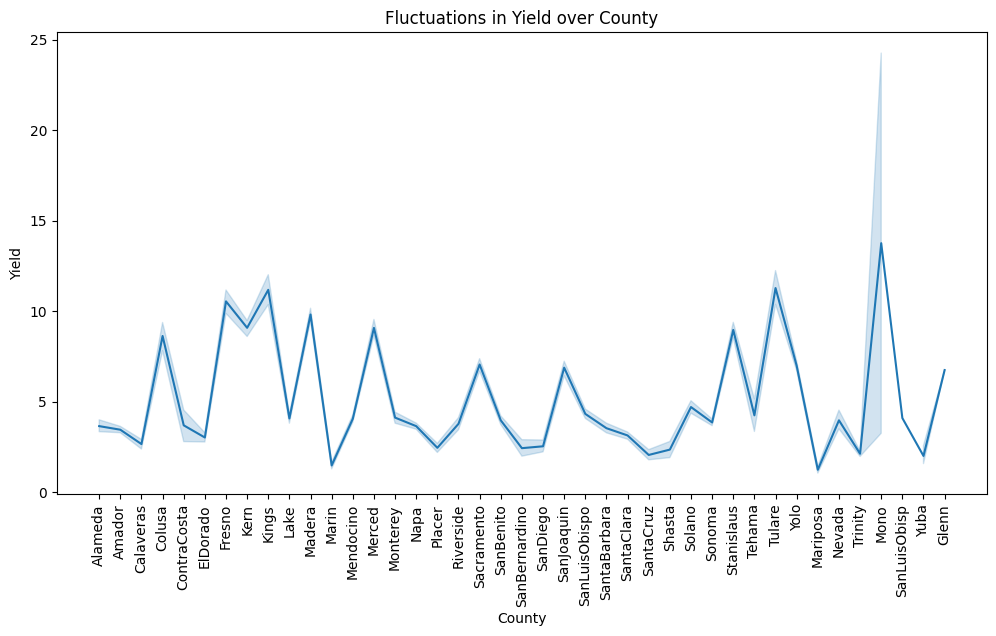

In [81]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='County', y='Yield')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in Yield over County')
plt.show()

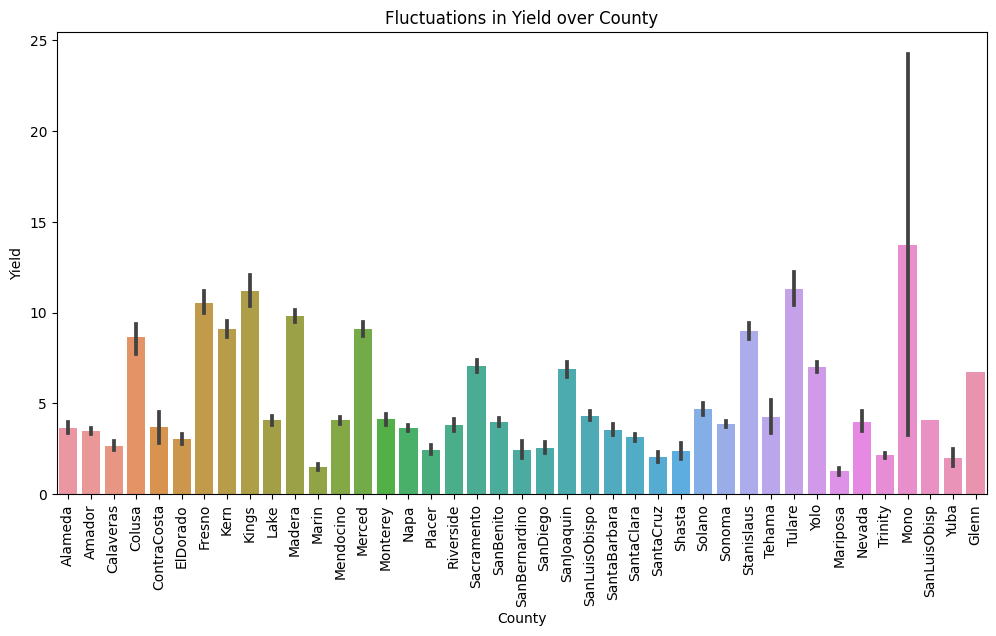

In [82]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='County', y='Yield')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in Yield over County')
plt.show()

In [83]:
data.sort_values('Yield').tail(1)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
302,2012,51,Mono,3.0,25.0,75.0,653.33,1,Medium


Text(0.5, 1.0, 'Top Wine Yield County')

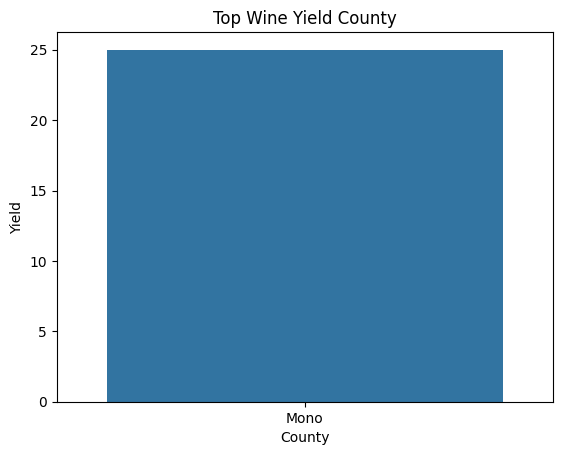

In [84]:
sns.barplot(x='County', y='Yield', data=data.sort_values('Yield').tail(1))
plt.title(label='Top Wine Yield County')

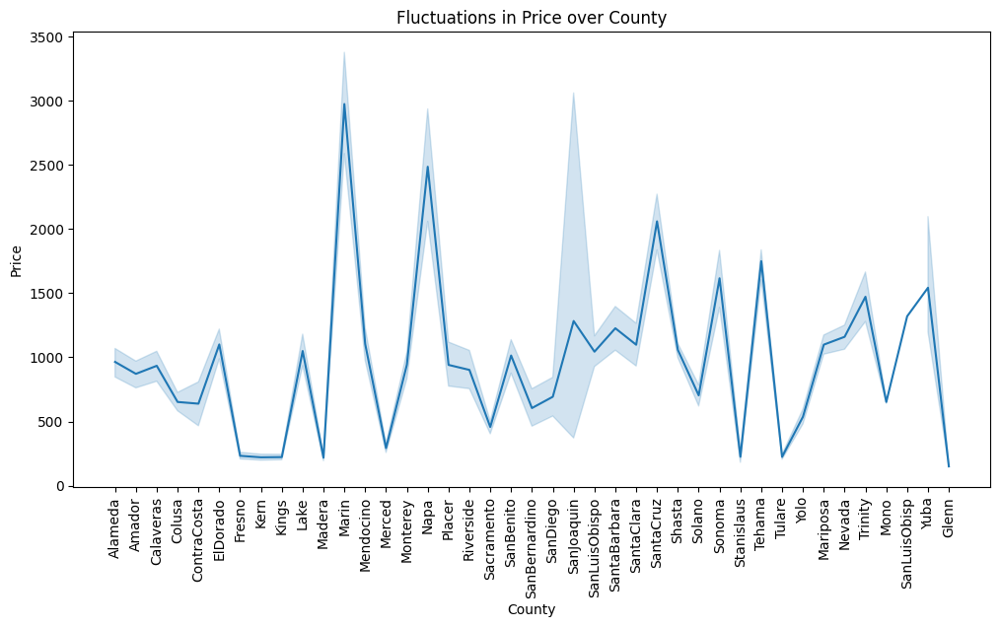

In [85]:
plt.figure(figsize=(12, 6))
sns.lineplot(data, x='County', y='Price')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in Price over County')
plt.show()

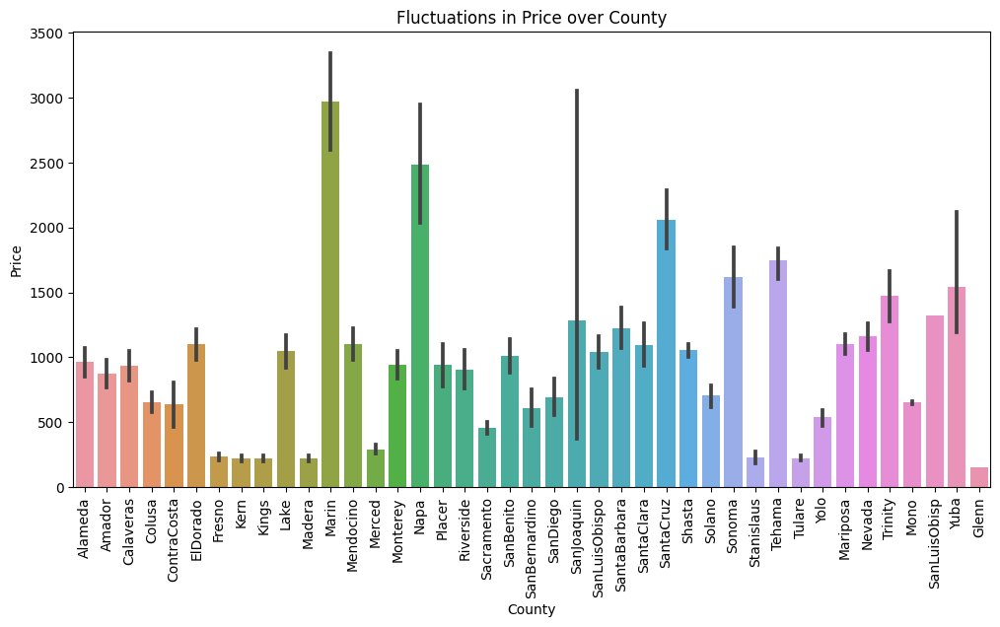

In [86]:
plt.figure(figsize=(12, 6))
sns.color_palette("tab10")
sns.barplot(data, x='County', y='Price')
plt.xticks(rotation=90)
plt.title(label='Fluctuations in Price over County')
plt.show()

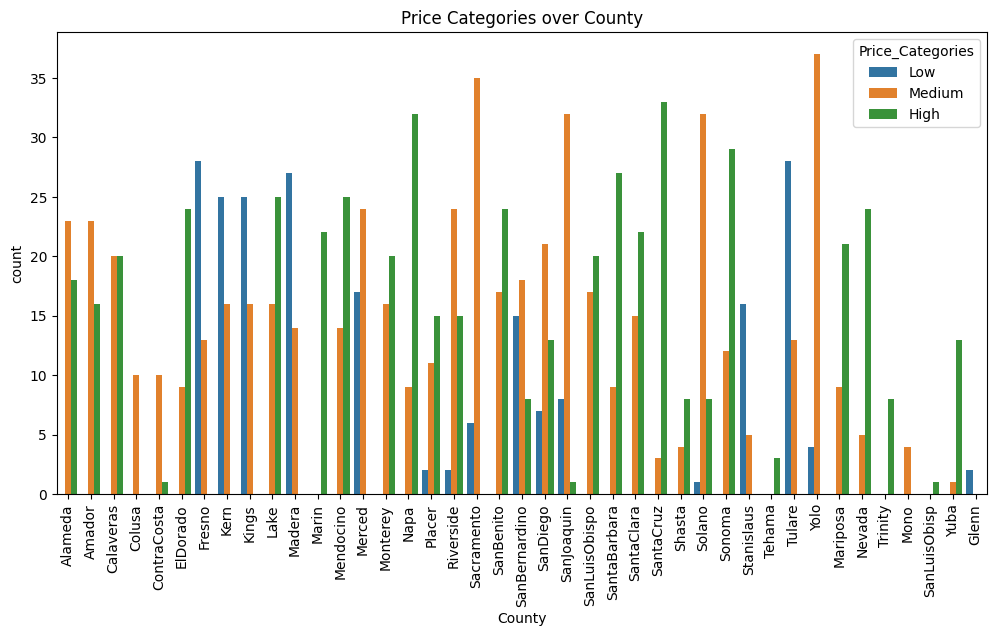

In [87]:
plt.figure(figsize=(12, 6))
sns.countplot(x='County', hue='Price_Categories', data=data)
plt.xticks(rotation=90)
plt.title(label='Price Categories over County')
plt.show()

In [88]:
data.sort_values('Price').tail(1)

,Year,CountyCode,County,HarvestedAcres,Yield,Production,Price,Price_Classification,Price_Categories
522,2006,77,SanJoaquin,92501.0,0.06,5610.0,36342.07,2,High


Text(0.5, 1.0, 'Top Wine Price County')

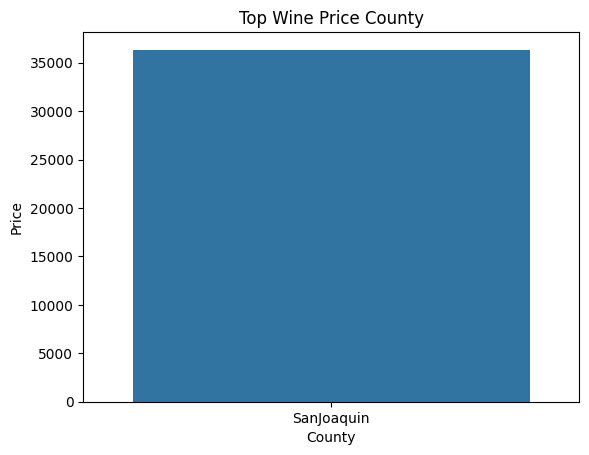

In [89]:
sns.barplot(x='County', y='Price', data=data.sort_values('Price').tail(1))
plt.title(label='Top Wine Price County')

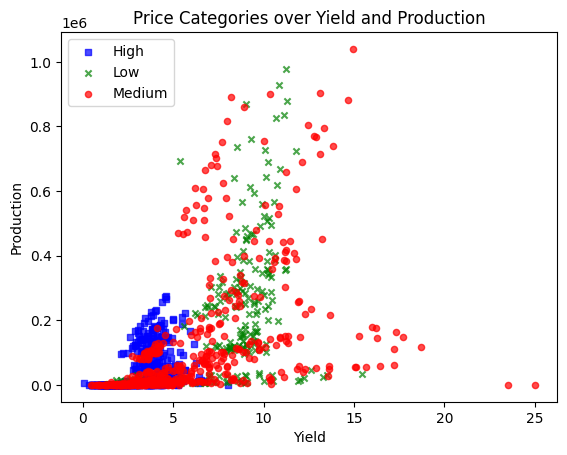

In [90]:
fig = category_scatter(x='Yield', y='Production', label_col='Price_Categories', data=data, legend_loc='upper left')
plt.xlabel('Yield')
plt.ylabel('Production')
plt.title(label='Price Categories over Yield and Production')
# plt.grid(True)
plt.show()

<b>Setting up the target variable. </b>

In [91]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1266 entries, 0 to 1314
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Year                  1266 non-null   int64   
 1   CountyCode            1266 non-null   int64   
 2   County                1266 non-null   object  
 3   HarvestedAcres        1266 non-null   float64 
 4   Yield                 1266 non-null   float64 
 5   Production            1266 non-null   float64 
 6   Price                 1266 non-null   float64 
 7   Price_Classification  1266 non-null   category
 8   Price_Categories      1266 non-null   category
dtypes: category(2), float64(4), int64(2), object(1)
memory usage: 81.9+ KB


In [92]:
features = ['Year', 'CountyCode', 'HarvestedAcres', 'Yield', 'Production']
x = data[features]
y = data.Price_Classification

In [93]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1266 entries, 0 to 1314
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Year            1266 non-null   int64  
 1   CountyCode      1266 non-null   int64  
 2   HarvestedAcres  1266 non-null   float64
 3   Yield           1266 non-null   float64
 4   Production      1266 non-null   float64
dtypes: float64(3), int64(2)
memory usage: 59.3 KB


In [94]:
y = y.astype('int64')
y.info()

<class 'pandas.core.series.Series'>
Int64Index: 1266 entries, 0 to 1314
Series name: Price_Classification
Non-Null Count  Dtype
--------------  -----
1266 non-null   int64
dtypes: int64(1)
memory usage: 19.8 KB


In [95]:
y.value_counts()

1    557
2    496
0    213
Name: Price_Classification, dtype: int64

(array([0, 1, 2]), [Text(0, 0, '1'), Text(1, 0, '2'), Text(2, 0, '0')])

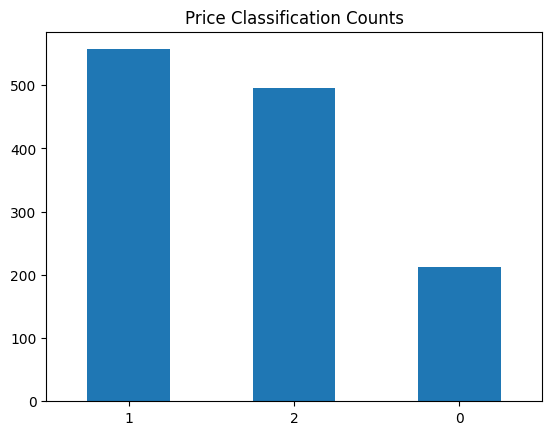

In [96]:
y.value_counts().plot(kind = 'bar', title = 'Price Classification Counts')
plt.xticks(rotation=0)

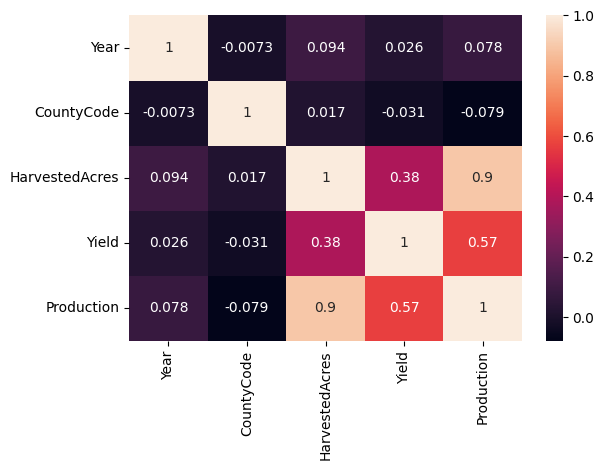

In [97]:
sns.heatmap(x.corr(), annot=True)
plt.tight_layout()

<b>Split dataset into 80% for training and 20% for testing. </b>

In [98]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 1)

In [99]:
print("Shape of original dataset:", data.shape)
print("Shape of input training set:", x_train.shape)
print("Shape of output training set:", y_train.shape)
print("Shape of input testing set:", x_test.shape)
print("Shape of output testing set:", y_test.shape)

Shape of original dataset: (1266, 9)
Shape of input training set: (1012, 5)
Shape of output training set: (1012,)
Shape of input testing set: (254, 5)
Shape of output testing set: (254,)


In [100]:
y_test.size

254

In [101]:
y_test.value_counts()

2    110
1    109
0     35
Name: Price_Classification, dtype: int64

<b>Performance Functions for Models</b>

In [102]:
true_class_names = ["True Low", "True Medium", "True High"]
predicted_class_names = ["Predicted Low", "Predicted Medium", "Predicted High"]

In [103]:
def Confusion_Matrix_Plotter(cm, dtype):
    cm_df = pd.DataFrame(cm, index = true_class_names, columns = predicted_class_names)
    if dtype == 1:
        sns.heatmap(cm_df, annot=True, fmt="d")
        plt.title('Confusion Matrix')
    else:
        sns.heatmap(cm_df, annot=True)
        plt.title('Confusion Matrix Percentage')
    plt.tight_layout()

In [104]:
def Compute_Error(cm):
    n11, n12, n13, n21, n22, n23, n31, n32, n33 = cm.ravel()
    TP_C1 = n11
    TN_C1 = n22 + n33
    FP_C1 = n21 + n31
    FN_C1 = n12 + n13
    Type1_Error_C1 = FP_C1
    Type2_Error_C1 = FN_C1
    print("Type1_Error_LowPrice:", Type1_Error_C1)
    print("Type2_Error_LowPrice:", Type2_Error_C1)
    TP_C2 = n22
    TN_C2 = n11 + n33
    FP_C2 = n12 + n32
    FN_C2 = n21 + n23
    Type1_Error_C2 = FP_C2
    Type2_Error_C2 = FN_C2
    print("Type1_Error_MediumPrice:", Type1_Error_C2)
    print("Type2_Error_MediumPrice:", Type2_Error_C2)
    TP_C3 = n33
    TN_C3 = n11 + n22
    FP_C3 = n13 + n23
    FN_C3 = n31 + n32
    Type1_Error_C3 = FP_C3
    Type2_Error_C3 = FN_C3
    print("Type1_Error_HighPrice:", Type1_Error_C3)
    print("Type2_Error_HighPrice:", Type2_Error_C3)
    return Type1_Error_C1, Type2_Error_C1, Type1_Error_C2, Type2_Error_C2, Type1_Error_C3, Type2_Error_C3

In [105]:
def Compute_Sensitivity(TP, FN):
    sensitivity_test = (TP / (TP + FN))
    return sensitivity_test

In [106]:
def Compute_Specificity(TN, FP):
    specificity_test = (TN / (FP + TN))
    return specificity_test

### Naive Bayes

In [107]:
nb = GaussianNB()
nb.fit(x_train, y_train)

GaussianNB()

In [108]:
# Model Scores on training and test set
print("Training Set score:", nb.score(x_train, y_train))
print("Test Set score:", nb.score(x_test, y_test))

Training Set score: 0.5928853754940712
Test Set score: 0.6181102362204725


In [109]:
# Prediction on Testing Data
y_pred_nb = nb.predict(x_test)
nb_accuracy = metrics.accuracy_score(y_test, y_pred_nb)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_nb))

Accuracy: 0.6181102362204725


In [110]:
# Prediction on Training Data
y_pred2_nb = nb.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_nb))

Accuracy: 0.5928853754940712


In [111]:
confusion_matrix_nb = metrics.confusion_matrix(y_test, y_pred_nb)
confusion_matrix_nb

array([[13, 20,  2],
       [15, 49, 45],
       [ 0, 15, 95]], dtype=int64)

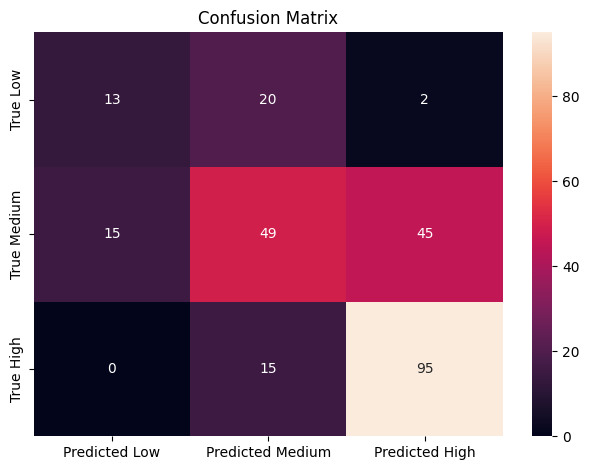

In [112]:
Confusion_Matrix_Plotter(confusion_matrix_nb, 1)

In [113]:
confusion_matrix_nb_percent = confusion_matrix_nb.astype('float') / confusion_matrix_nb.sum(axis=1)[:, np.newaxis]
confusion_matrix_nb_percent

array([[0.37142857, 0.57142857, 0.05714286],
       [0.13761468, 0.44954128, 0.41284404],
       [0.        , 0.13636364, 0.86363636]])

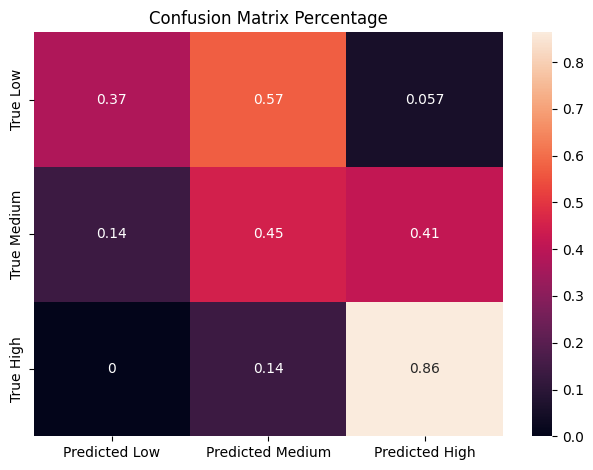

In [114]:
Confusion_Matrix_Plotter(confusion_matrix_nb_percent, 0)

In [115]:
print(classification_report(y_test, y_pred_nb, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.46      0.37      0.41        35
Medium Price       0.58      0.45      0.51       109
  High Price       0.67      0.86      0.75       110

    accuracy                           0.62       254
   macro avg       0.57      0.56      0.56       254
weighted avg       0.60      0.62      0.60       254



In [116]:
nb_t1_l, nb_t2_l, nb_t1_m, nb_t2_m, nb_t1_h, nb_t2_h = Compute_Error(confusion_matrix_nb)

Type1_Error_LowPrice: 15
Type2_Error_LowPrice: 22
Type1_Error_MediumPrice: 35
Type2_Error_MediumPrice: 60
Type1_Error_HighPrice: 47
Type2_Error_HighPrice: 15


In [117]:
cross_val_score(nb, x_train, y_train, cv = 10, scoring='accuracy')

array([0.51960784, 0.60784314, 0.6039604 , 0.65346535, 0.6039604 ,
       0.5049505 , 0.63366337, 0.64356436, 0.57425743, 0.57425743])

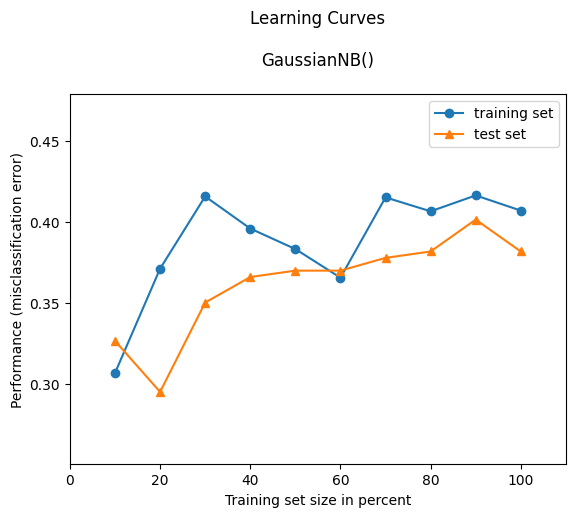

In [118]:
plot_learning_curves(x_train, y_train, x_test, y_test, nb)
plt.show()

### Support Vector Classification

In [119]:
svc = SVC()
svc.fit(x_train, y_train)

SVC()

In [120]:
# Model Scores on training and test set
print("Training Set score:", svc.score(x_train, y_train))
print("Test Set score:", svc.score(x_test, y_test))

Training Set score: 0.5365612648221344
Test Set score: 0.5511811023622047


In [121]:
# Prediction on Testing Data
y_pred_svc = svc.predict(x_test)
svc_accuracy = metrics.accuracy_score(y_test, y_pred_svc)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_svc))

Accuracy: 0.5511811023622047


In [122]:
# Prediction on Training Data
y_pred2_svc = svc.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_svc))

Accuracy: 0.5365612648221344


In [123]:
confusion_matrix_svc = metrics.confusion_matrix(y_test, y_pred_svc)
confusion_matrix_svc

array([[11, 18,  6],
       [ 9, 44, 56],
       [ 2, 23, 85]], dtype=int64)

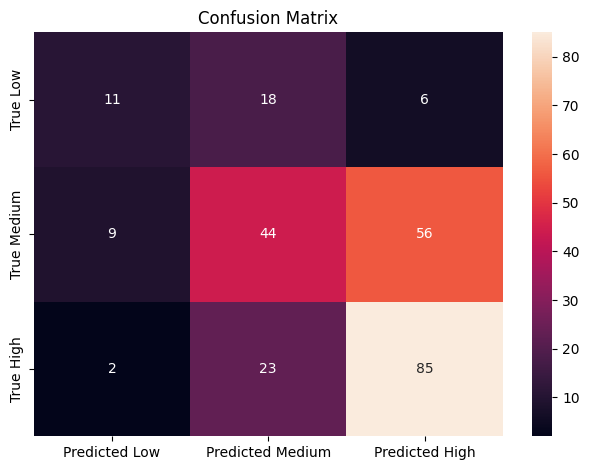

In [124]:
Confusion_Matrix_Plotter(confusion_matrix_svc, 1)

In [125]:
confusion_matrix_svc_percent = confusion_matrix_svc.astype('float') / confusion_matrix_svc.sum(axis=1)[:, np.newaxis]
confusion_matrix_svc_percent

array([[0.31428571, 0.51428571, 0.17142857],
       [0.08256881, 0.40366972, 0.51376147],
       [0.01818182, 0.20909091, 0.77272727]])

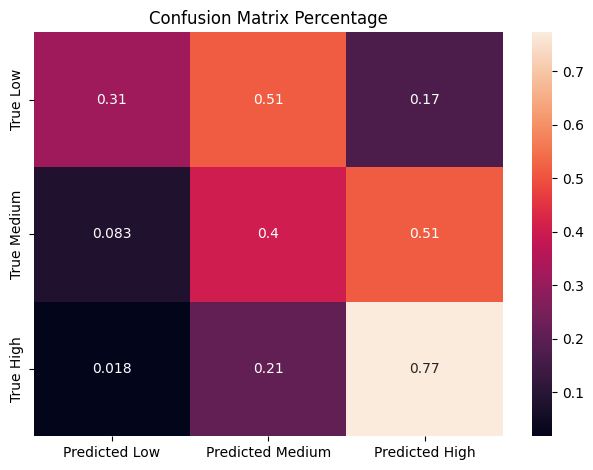

In [126]:
Confusion_Matrix_Plotter(confusion_matrix_svc_percent, 0)

In [127]:
print(classification_report(y_test, y_pred_svc, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.50      0.31      0.39        35
Medium Price       0.52      0.40      0.45       109
  High Price       0.58      0.77      0.66       110

    accuracy                           0.55       254
   macro avg       0.53      0.50      0.50       254
weighted avg       0.54      0.55      0.53       254



In [128]:
svc_t1_l, svc_t2_l, svc_t1_m, svc_t2_m, svc_t1_h, svc_t2_h = Compute_Error(confusion_matrix_svc)

Type1_Error_LowPrice: 11
Type2_Error_LowPrice: 24
Type1_Error_MediumPrice: 41
Type2_Error_MediumPrice: 65
Type1_Error_HighPrice: 62
Type2_Error_HighPrice: 25


In [129]:
cross_val_score(svc, x_train, y_train, cv = 10, scoring='accuracy')

array([0.60784314, 0.49019608, 0.5049505 , 0.5049505 , 0.56435644,
       0.51485149, 0.47524752, 0.57425743, 0.48514851, 0.54455446])

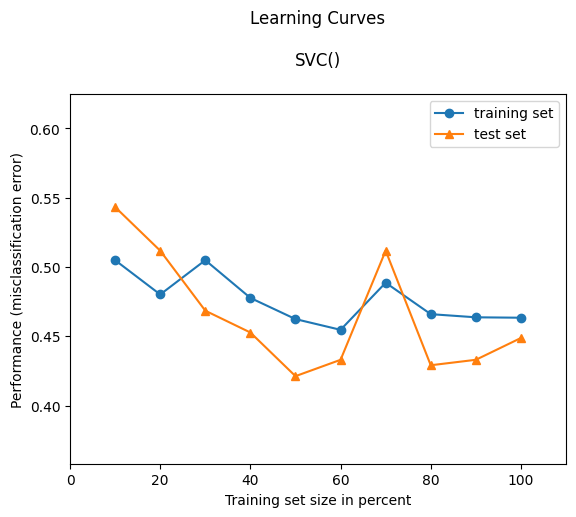

In [130]:
plot_learning_curves(x_train, y_train, x_test, y_test, svc)
plt.show()

<b>Applying GridSearchCV. </b>

In [131]:
svc.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [132]:
param_grid = {'C': [0.1, 1, 10, 100], 'kernel': ['rbf', 'poly', 'sigmoid', 'linear'], 
              'degree': [1, 2, 3, 4, 5], 'gamma': [1, 0.1, 0.01, 0.001]}

In [133]:
param_grid = {'C': [0.1, 1, 10], 'kernel': ['rbf', 'sigmoid'], 
              'degree': [1, 2, 3], 'gamma': [1, 0.1, 0.01]}

In [134]:
svc_gscv = GridSearchCV(SVC(), param_grid, refit=True, verbose=1)

In [135]:
svc_gscv.fit(x_train, y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'degree': [1, 2, 3],
                         'gamma': [1, 0.1, 0.01],
                         'kernel': ['rbf', 'sigmoid']},
             verbose=1)

In [136]:
# Model Scores on training and test set
print("Training Set score:", svc_gscv.score(x_train, y_train))
print("Test Set score:", svc_gscv.score(x_test, y_test))

Training Set score: 0.9980237154150198
Test Set score: 0.4763779527559055


In [137]:
#printing best parameter after tuning
print("GridSearch CV Best Parameters:", svc_gscv.best_params_) 

#printing how our model looks after hyper-parameter tuning
print("\nGridSearch CV Best Estimator:", svc_gscv.best_estimator_)

# best score achieved during the GridSearchCV
print("\nGridSearch CV Best score:", svc_gscv.best_score_)

GridSearch CV Best Parameters: {'C': 1, 'degree': 1, 'gamma': 0.01, 'kernel': 'rbf'}

GridSearch CV Best Estimator: SVC(C=1, degree=1, gamma=0.01)

GridSearch CV Best score: 0.4723113690679413


In [138]:
# Prediction on Testing Data
y_pred_svc = svc_gscv.predict(x_test)
svc_accuracy = metrics.accuracy_score(y_test, y_pred_svc)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_svc))

Accuracy: 0.4763779527559055


In [139]:
# Prediction on Training Data
y_pred2_svc = svc_gscv.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_svc))

Accuracy: 0.9980237154150198


In [140]:
confusion_matrix_svc = metrics.confusion_matrix(y_test, y_pred_svc)
confusion_matrix_svc

array([[  0,  35,   0],
       [  0, 109,   0],
       [  0,  98,  12]], dtype=int64)

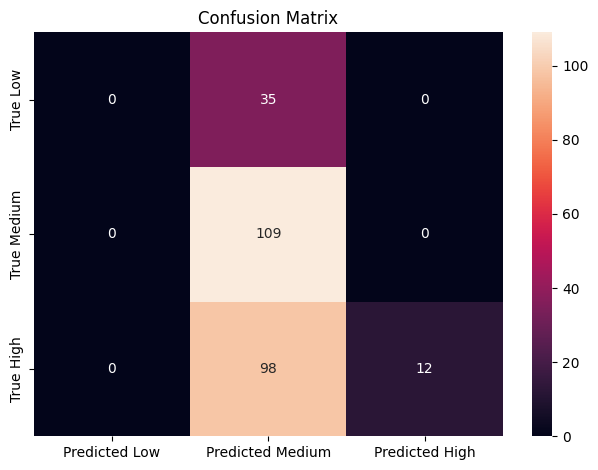

In [141]:
Confusion_Matrix_Plotter(confusion_matrix_svc, 1)

In [142]:
confusion_matrix_svc_percent = confusion_matrix_svc.astype('float') / confusion_matrix_svc.sum(axis=1)[:, np.newaxis]
confusion_matrix_svc_percent

array([[0.        , 1.        , 0.        ],
       [0.        , 1.        , 0.        ],
       [0.        , 0.89090909, 0.10909091]])

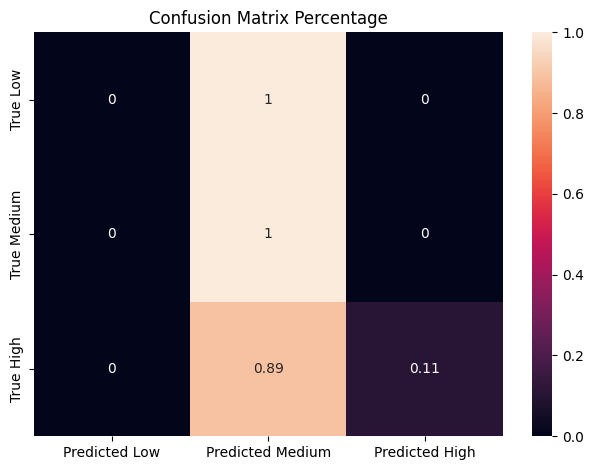

In [143]:
Confusion_Matrix_Plotter(confusion_matrix_svc_percent, 0)

In [144]:
print(classification_report(y_test, y_pred_svc, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.00      0.00      0.00        35
Medium Price       0.45      1.00      0.62       109
  High Price       1.00      0.11      0.20       110

    accuracy                           0.48       254
   macro avg       0.48      0.37      0.27       254
weighted avg       0.63      0.48      0.35       254



In [145]:
svc_t1_l, svc_t2_l, svc_t1_m, svc_t2_m, svc_t1_h, svc_t2_h = Compute_Error(confusion_matrix_svc)

Type1_Error_LowPrice: 0
Type2_Error_LowPrice: 35
Type1_Error_MediumPrice: 133
Type2_Error_MediumPrice: 0
Type1_Error_HighPrice: 0
Type2_Error_HighPrice: 98


### Logistic Regression with Grid Search CV

In [146]:
logreg = LogisticRegression()
logreg.fit(x_train, y_train)

LogisticRegression()

In [147]:
# Model Scores on training and test set
print("Training Set score:", logreg.score(x_train, y_train))
print("Test Set score:", logreg.score(x_test, y_test))

Training Set score: 0.5523715415019763
Test Set score: 0.5590551181102362


In [148]:
# Prediction on Testing Data
y_pred_lr = logreg.predict(x_test)
lr_accuracy = metrics.accuracy_score(y_test, y_pred_lr)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_lr))

Accuracy: 0.5590551181102362


In [149]:
# Prediction on Training Data
y_pred2_lr = logreg.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_lr))

Accuracy: 0.5523715415019763


In [150]:
confusion_matrix_lr = metrics.confusion_matrix(y_test, y_pred_lr)
confusion_matrix_lr

array([[ 6, 26,  3],
       [10, 43, 56],
       [ 0, 17, 93]], dtype=int64)

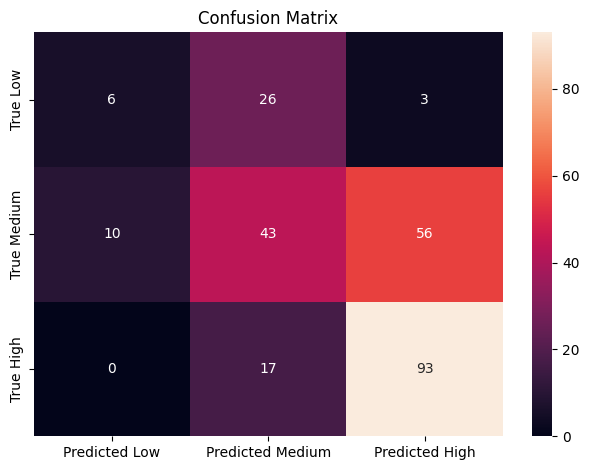

In [151]:
Confusion_Matrix_Plotter(confusion_matrix_lr, 1)

In [152]:
confusion_matrix_lr_percent = confusion_matrix_lr.astype('float') / confusion_matrix_lr.sum(axis=1)[:, np.newaxis]
confusion_matrix_lr_percent

array([[0.17142857, 0.74285714, 0.08571429],
       [0.09174312, 0.39449541, 0.51376147],
       [0.        , 0.15454545, 0.84545455]])

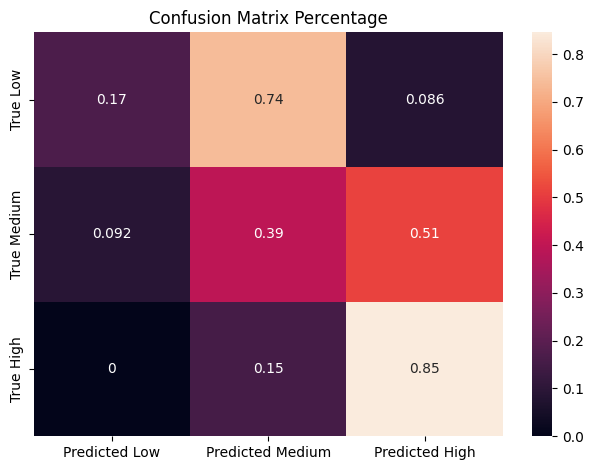

In [153]:
Confusion_Matrix_Plotter(confusion_matrix_lr_percent, 0)

In [154]:
print(classification_report(y_test, y_pred_lr, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.38      0.17      0.24        35
Medium Price       0.50      0.39      0.44       109
  High Price       0.61      0.85      0.71       110

    accuracy                           0.56       254
   macro avg       0.50      0.47      0.46       254
weighted avg       0.53      0.56      0.53       254



In [155]:
lr_t1_l, lr_t2_l, lr_t1_m, lr_t2_m, lr_t1_h, lr_t2_h = Compute_Error(confusion_matrix_lr)

Type1_Error_LowPrice: 10
Type2_Error_LowPrice: 29
Type1_Error_MediumPrice: 43
Type2_Error_MediumPrice: 66
Type1_Error_HighPrice: 59
Type2_Error_HighPrice: 17


In [156]:
cross_val_score(logreg, x_train, y_train, cv = 10, scoring='accuracy')

array([0.55882353, 0.55882353, 0.53465347, 0.5049505 , 0.47524752,
       0.58415842, 0.58415842, 0.56435644, 0.4950495 , 0.48514851])

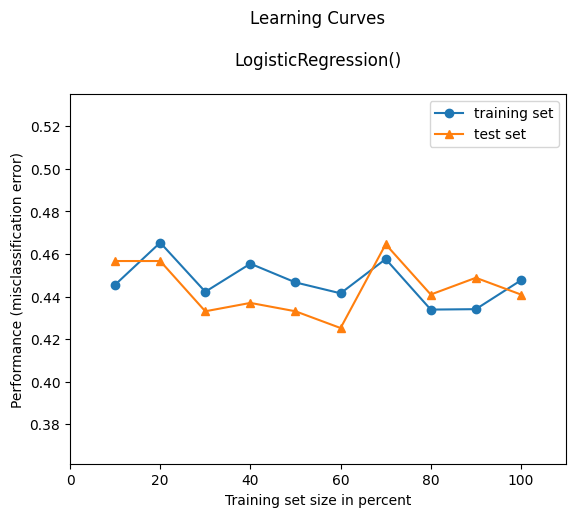

In [157]:
plot_learning_curves(x_train, y_train, x_test, y_test, logreg)
plt.show()

<b>Applying GridSearchCV. </b>

In [158]:
logreg.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [159]:
parameters = {'penalty': ['l1', 'l2'], 'C': np.logspace(-3, 3, 7), 'solver': ['newton-cg', 'lbfgs', 'liblinear']}

In [160]:
lr_gs = GridSearchCV(estimator = logreg, param_grid = parameters, scoring = 'accuracy', cv = 10, verbose=1)

In [161]:
lr_gs.fit(x_train, y_train)

Fitting 10 folds for each of 42 candidates, totalling 420 fits


GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy', verbose=1)

In [162]:
# Prediction on Testing Data
y_pred_lr = lr_gs.predict(x_test)
lr_gs_accuracy = metrics.accuracy_score(y_test, y_pred_lr)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_lr))

Accuracy: 0.7047244094488189


In [163]:
# Prediction on Training Data
y_pred2_lr = lr_gs.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_lr))

Accuracy: 0.7183794466403162


In [164]:
confusion_matrix_lr = metrics.confusion_matrix(y_test, y_pred_lr)
confusion_matrix_lr

array([[10, 24,  1],
       [ 9, 80, 20],
       [ 0, 21, 89]], dtype=int64)

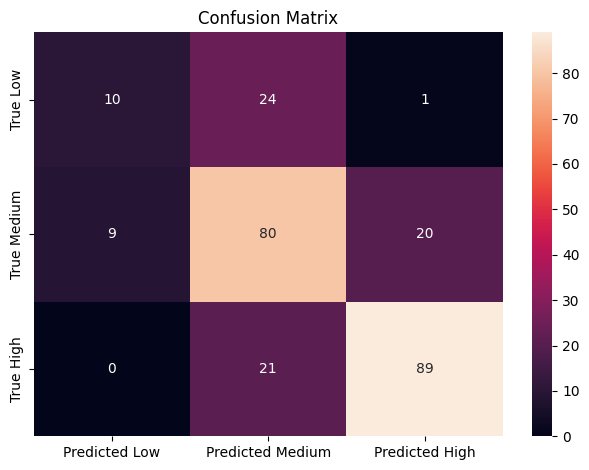

In [165]:
Confusion_Matrix_Plotter(confusion_matrix_lr, 1)

In [166]:
confusion_matrix_lr_percent = confusion_matrix_lr.astype('float') / confusion_matrix_lr.sum(axis=1)[:, np.newaxis]
confusion_matrix_lr_percent

array([[0.28571429, 0.68571429, 0.02857143],
       [0.08256881, 0.73394495, 0.18348624],
       [0.        , 0.19090909, 0.80909091]])

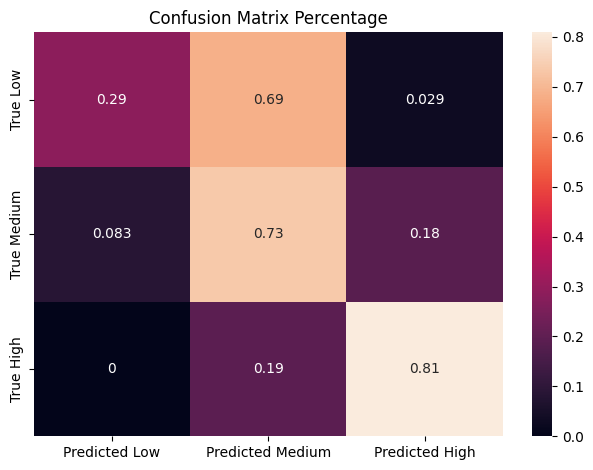

In [167]:
Confusion_Matrix_Plotter(confusion_matrix_lr_percent, 0)

In [168]:
print(classification_report(y_test, y_pred_lr, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.53      0.29      0.37        35
Medium Price       0.64      0.73      0.68       109
  High Price       0.81      0.81      0.81       110

    accuracy                           0.70       254
   macro avg       0.66      0.61      0.62       254
weighted avg       0.70      0.70      0.69       254



In [169]:
lr_t1_l, lr_t2_l, lr_t1_m, lr_t2_m, lr_t1_h, lr_t2_h = Compute_Error(confusion_matrix_lr)

Type1_Error_LowPrice: 9
Type2_Error_LowPrice: 25
Type1_Error_MediumPrice: 45
Type2_Error_MediumPrice: 29
Type1_Error_HighPrice: 21
Type2_Error_HighPrice: 21


Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits
Fitting 10 folds for each of 42 candidates, totalling 420 fits


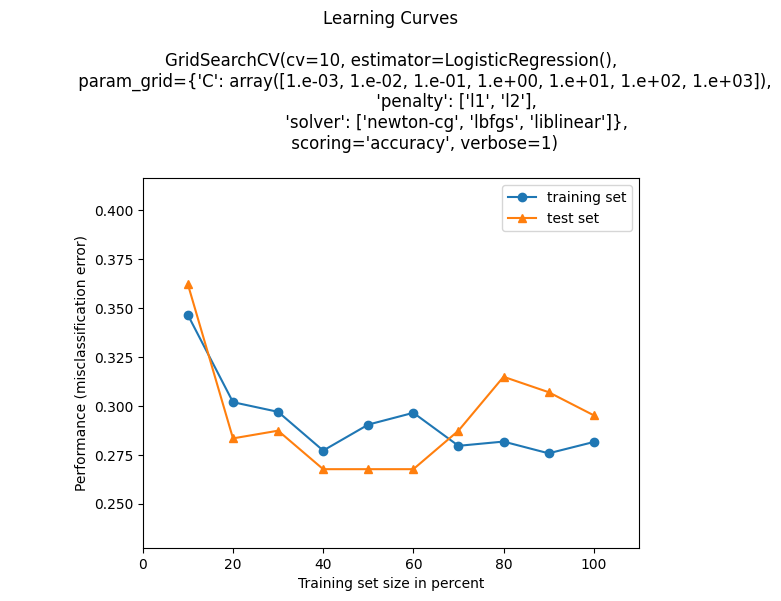

In [170]:
plot_learning_curves(x_train, y_train, x_test, y_test, lr_gs)
plt.show()

### AdaBoost Classifier

In [171]:
abc = AdaBoostClassifier()
abc.fit(x_train, y_train)

AdaBoostClassifier()

In [172]:
# Model Scores on training and test set
print("Training Set score:", abc.score(x_train, y_train))
print("Test Set score:", abc.score(x_test, y_test))

Training Set score: 0.7845849802371542
Test Set score: 0.7716535433070866


In [173]:
# Prediction on Testing Data
y_pred_abc = abc.predict(x_test)
abc_accuracy = metrics.accuracy_score(y_test, y_pred_abc)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_abc))

Accuracy: 0.7716535433070866


In [174]:
# Prediction on Training Data
y_pred2_abc = abc.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_abc))

Accuracy: 0.7845849802371542


In [175]:
confusion_matrix_abc = metrics.confusion_matrix(y_test, y_pred_abc)
confusion_matrix_abc

array([[21, 14,  0],
       [ 9, 88, 12],
       [ 0, 23, 87]], dtype=int64)

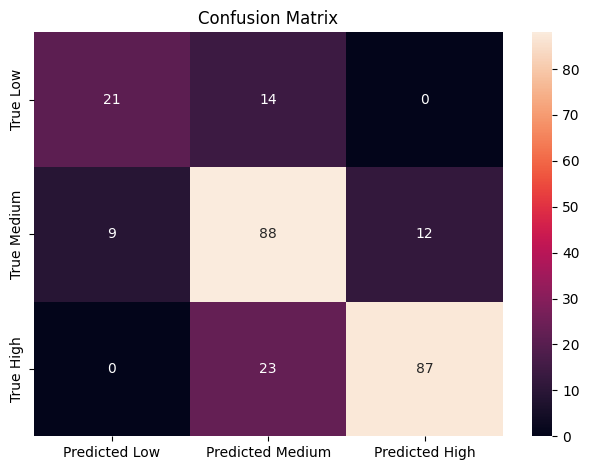

In [176]:
Confusion_Matrix_Plotter(confusion_matrix_abc, 1)

In [177]:
confusion_matrix_abc_percent = confusion_matrix_abc.astype('float') / confusion_matrix_abc.sum(axis=1)[:, np.newaxis]
confusion_matrix_abc_percent

array([[0.6       , 0.4       , 0.        ],
       [0.08256881, 0.80733945, 0.11009174],
       [0.        , 0.20909091, 0.79090909]])

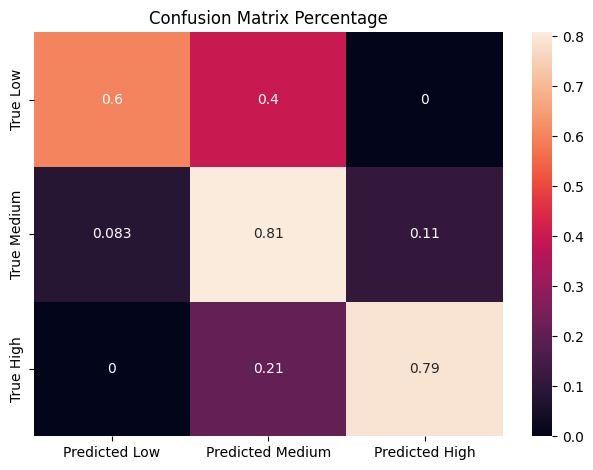

In [178]:
Confusion_Matrix_Plotter(confusion_matrix_abc_percent, 0)

In [179]:
print(classification_report(y_test, y_pred_abc, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.70      0.60      0.65        35
Medium Price       0.70      0.81      0.75       109
  High Price       0.88      0.79      0.83       110

    accuracy                           0.77       254
   macro avg       0.76      0.73      0.74       254
weighted avg       0.78      0.77      0.77       254



In [180]:
abc_t1_l, abc_t2_l, abc_t1_m, abc_t2_m, abc_t1_h, abc_t2_h = Compute_Error(confusion_matrix_abc)

Type1_Error_LowPrice: 9
Type2_Error_LowPrice: 14
Type1_Error_MediumPrice: 37
Type2_Error_MediumPrice: 21
Type1_Error_HighPrice: 12
Type2_Error_HighPrice: 23


In [181]:
cross_val_score(abc, x_train, y_train, cv = 10, scoring='accuracy')

array([0.73529412, 0.80392157, 0.73267327, 0.78217822, 0.78217822,
       0.76237624, 0.71287129, 0.75247525, 0.84158416, 0.84158416])

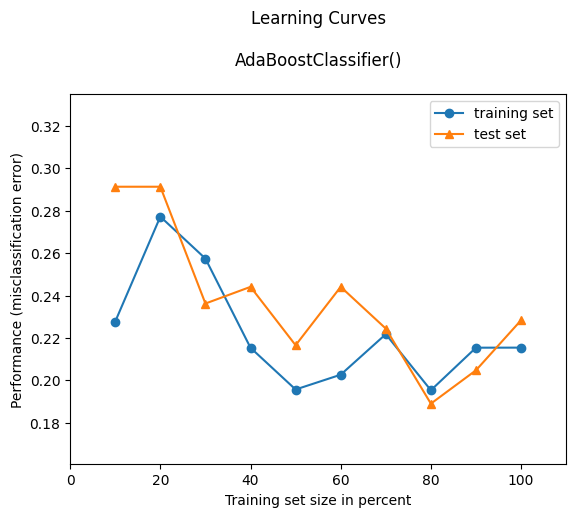

In [182]:
plot_learning_curves(x_train, y_train, x_test, y_test, abc)
plt.show()

### K-Nearest Neighbours

In [183]:
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

KNeighborsClassifier()

In [184]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [185]:
k_range = list(range(1, 31))

In [186]:
grid_params = {'n_neighbors': k_range, 'weights': ['uniform', 'distance'], 
               'metric': ['euclidean', 'manhattan', 'minkowski', 'chebyshev']}

In [187]:
knn_gscv = GridSearchCV(KNeighborsClassifier(), grid_params, cv=10)

In [188]:
knn_gscv.fit(x_train, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski',
                                    'chebyshev'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30],
                         'weights': ['uniform', 'distance']})

In [189]:
# Model Scores on training and test set
print("Training Set score:", knn_gscv.score(x_train, y_train))
print("Test Set score:", knn_gscv.score(x_test, y_test))

Training Set score: 1.0
Test Set score: 0.65748031496063


In [190]:
print("GridSearch CV Best Parameters:", knn_gscv.best_params_) 

print("\nGridSearch CV Best Estimator:", knn_gscv.best_estimator_)

print("\nGridSearch CV Best score:", knn_gscv.best_score_)

GridSearch CV Best Parameters: {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}

GridSearch CV Best Estimator: KNeighborsClassifier(metric='manhattan', n_neighbors=11, weights='distance')

GridSearch CV Best score: 0.6521646282275285


In [191]:
# Prediction on Testing Data
y_pred_knn = knn_gscv.predict(x_test)
knn_accuracy = metrics.accuracy_score(y_test, y_pred_knn)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_knn))

Accuracy: 0.65748031496063


In [192]:
# Prediction on Training Data
y_pred2_knn = knn_gscv.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_knn))

Accuracy: 1.0


In [193]:
confusion_matrix_knn = metrics.confusion_matrix(y_test, y_pred_knn)
confusion_matrix_knn

array([[19, 15,  1],
       [12, 76, 21],
       [ 1, 37, 72]], dtype=int64)

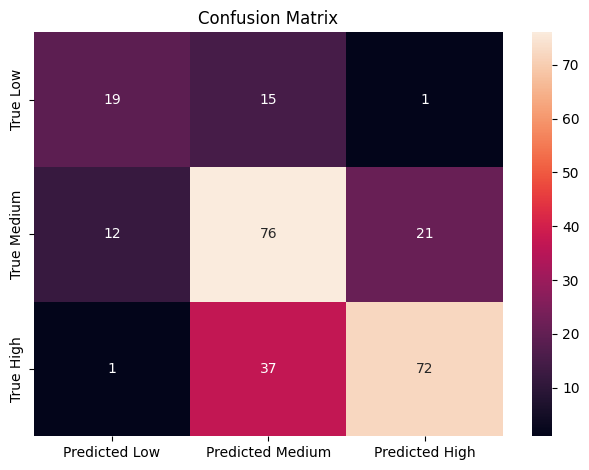

In [194]:
Confusion_Matrix_Plotter(confusion_matrix_knn, 1)

In [195]:
confusion_matrix_knn_percent = confusion_matrix_knn.astype('float') / confusion_matrix_knn.sum(axis=1)[:, np.newaxis]
confusion_matrix_knn_percent

array([[0.54285714, 0.42857143, 0.02857143],
       [0.11009174, 0.69724771, 0.19266055],
       [0.00909091, 0.33636364, 0.65454545]])

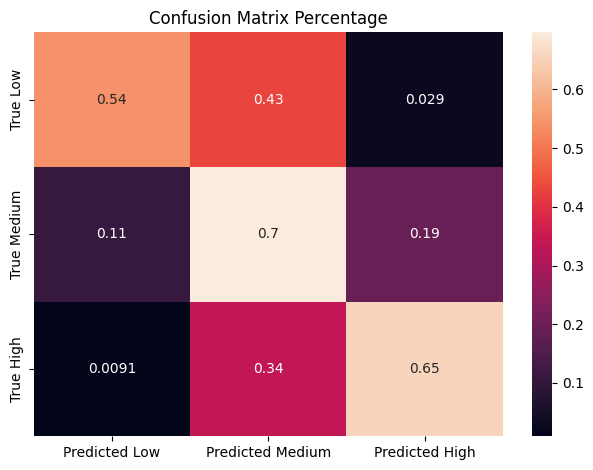

In [196]:
Confusion_Matrix_Plotter(confusion_matrix_knn_percent, 0)

In [197]:
print(classification_report(y_test, y_pred_knn, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.59      0.54      0.57        35
Medium Price       0.59      0.70      0.64       109
  High Price       0.77      0.65      0.71       110

    accuracy                           0.66       254
   macro avg       0.65      0.63      0.64       254
weighted avg       0.67      0.66      0.66       254



In [198]:
knn_t1_l, knn_t2_l, knn_t1_m, knn_t2_m, knn_t1_h, knn_t2_h = Compute_Error(confusion_matrix_knn)

Type1_Error_LowPrice: 13
Type2_Error_LowPrice: 16
Type1_Error_MediumPrice: 52
Type2_Error_MediumPrice: 33
Type1_Error_HighPrice: 22
Type2_Error_HighPrice: 38


In [199]:
# cross_val_score(knn_gscv, x_train, y_train, cv = 10, scoring='accuracy')

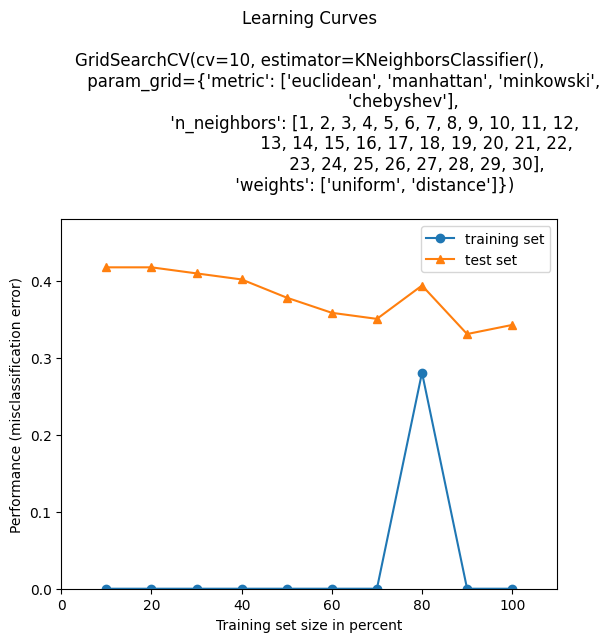

In [200]:
plot_learning_curves(x_train, y_train, x_test, y_test, knn_gscv)
plt.show()

### Decision Tree

In [201]:
dtc = DecisionTreeClassifier()
dtc.fit(x_train, y_train)

DecisionTreeClassifier()

In [202]:
# Model Scores on training and test set
print("Training Set score:", dtc.score(x_train, y_train))
print("Test Set score:", dtc.score(x_test, y_test))

Training Set score: 1.0
Test Set score: 0.8503937007874016


In [203]:
def Plotter(df):
    plt.figure(figsize = (100, 35))
    print_tree = tree.plot_tree(df,
                       feature_names = features,
                       class_names = ['1','2','3'],
                       rounded = True,
                       filled = True)
    plt.show()

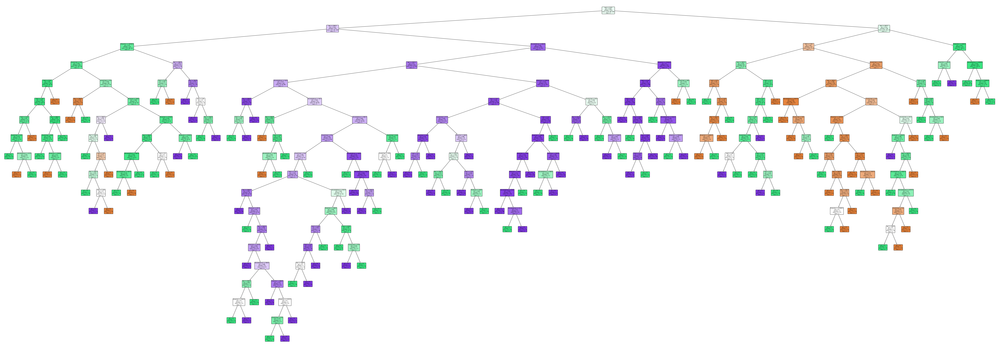

In [204]:
Plotter(dtc)

In [205]:
dtc_print_tree = tree.export_text(dtc, feature_names = features)
# print_tree

In [206]:
# Prediction on Testing Data
y_pred_dtc = dtc.predict(x_test)
dtc_accuracy = metrics.accuracy_score(y_test, y_pred_dtc)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_dtc))

Accuracy: 0.8503937007874016


In [207]:
# Prediction on Training Data
y_pred2_dtc = dtc.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_dtc))

Accuracy: 1.0


In [208]:
confusion_matrix_dtc = metrics.confusion_matrix(y_test, y_pred_dtc)
confusion_matrix_dtc

array([[30,  5,  0],
       [ 5, 91, 13],
       [ 1, 14, 95]], dtype=int64)

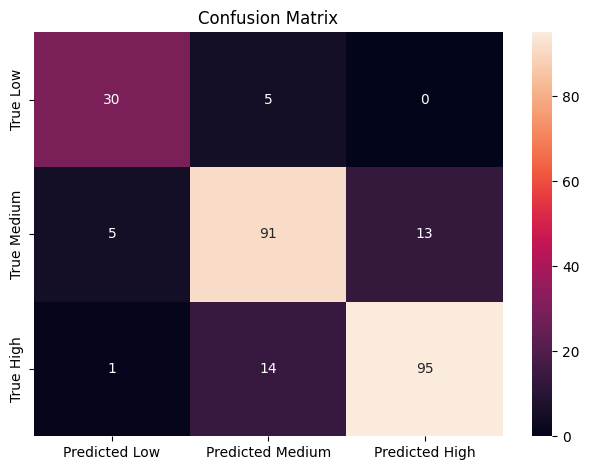

In [209]:
Confusion_Matrix_Plotter(confusion_matrix_dtc, 1)

In [210]:
confusion_matrix_dtc_percent = confusion_matrix_dtc.astype('float') / confusion_matrix_dtc.sum(axis=1)[:, np.newaxis]
confusion_matrix_dtc_percent

array([[0.85714286, 0.14285714, 0.        ],
       [0.04587156, 0.83486239, 0.11926606],
       [0.00909091, 0.12727273, 0.86363636]])

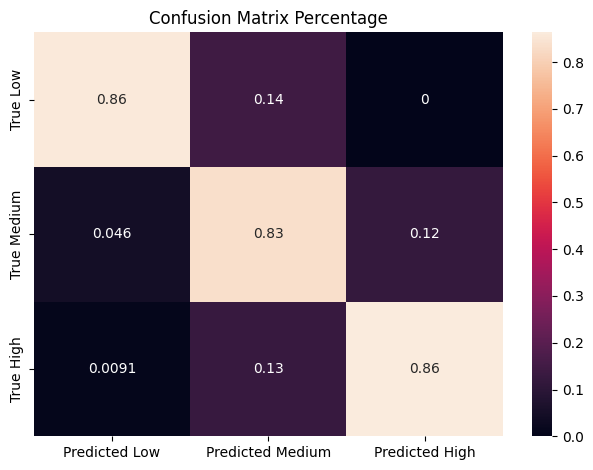

In [211]:
Confusion_Matrix_Plotter(confusion_matrix_dtc_percent, 0)

In [212]:
print(classification_report(y_test, y_pred_dtc, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.83      0.86      0.85        35
Medium Price       0.83      0.83      0.83       109
  High Price       0.88      0.86      0.87       110

    accuracy                           0.85       254
   macro avg       0.85      0.85      0.85       254
weighted avg       0.85      0.85      0.85       254



In [213]:
dt_t1_l, dt_t2_l, dt_t1_m, dt_t2_m, dt_t1_h, dt_t2_h = Compute_Error(confusion_matrix_dtc)

Type1_Error_LowPrice: 6
Type2_Error_LowPrice: 5
Type1_Error_MediumPrice: 19
Type2_Error_MediumPrice: 18
Type1_Error_HighPrice: 13
Type2_Error_HighPrice: 15


In [214]:
cross_val_score(dtc, x_train, y_train, cv = 10, scoring='accuracy')

array([0.81372549, 0.82352941, 0.79207921, 0.87128713, 0.88118812,
       0.83168317, 0.85148515, 0.85148515, 0.85148515, 0.83168317])

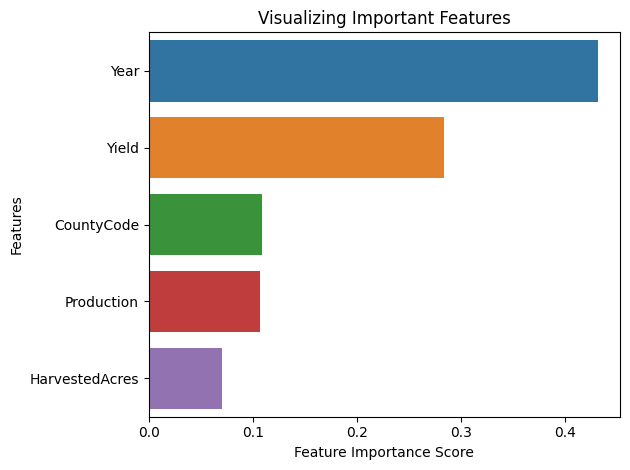

In [215]:
feature_importance = pd.Series(dtc.feature_importances_, index = x_test.columns).sort_values(ascending = False)

sns.barplot(x = feature_importance, y = feature_importance.index)
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Visualizing Important Features")
plt.tight_layout()

<b>Finding the best parameter max_leaf_nodes using GridSearchCV()</b>

In [216]:
dtc.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [217]:
leaf_nodes_list = list(range(1, 16))

In [219]:
parameters = {'max_leaf_nodes': leaf_nodes_list, 'criterion': ['gini', 'entropy'], 'min_samples_split': [2, 5, 10], 
              'min_samples_leaf': [1, 2, 3, 4, 5, 6]}
dt_gscv = GridSearchCV(estimator = dtc,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 10)
dt_gscv = dt_gscv.fit(x_train, y_train)
print("Best Parameters:", dt_gscv.best_params_)

Best Parameters: {'criterion': 'gini', 'max_leaf_nodes': 11, 'min_samples_leaf': 6, 'min_samples_split': 2}


In [220]:
print("GridSearch CV Best Parameters:", dt_gscv.best_params_) 

print("\nGridSearch CV Best Estimator:", dt_gscv.best_estimator_)

print("\nGridSearch CV Best score:", dt_gscv.best_score_)

GridSearch CV Best Parameters: {'criterion': 'gini', 'max_leaf_nodes': 11, 'min_samples_leaf': 6, 'min_samples_split': 2}

GridSearch CV Best Estimator: DecisionTreeClassifier(max_leaf_nodes=11, min_samples_leaf=6)

GridSearch CV Best score: 0.8300524170064065


Text(0.5, 1.0, 'Plot of Tree Size VS Classification Rate')

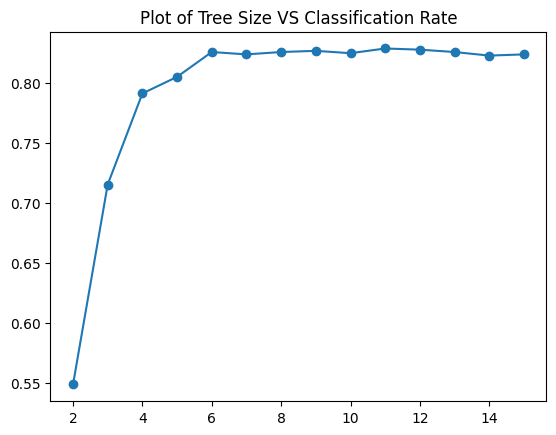

In [221]:
nleaf_list = []
score_list = []
for i in range(2, 16):
    nleaf_list.append(i)
    parameters = {'max_leaf_nodes': [i]}
    grid_search = GridSearchCV(estimator = dtc,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 10)
    grid_search = grid_search.fit(x_train, y_train)
    score_list.append(grid_search.best_score_)

# Plot of tree sizes VS classification rate.
plt.plot(nleaf_list, score_list)
plt.scatter(nleaf_list, score_list)
plt.title("Plot of Tree Size VS Classification Rate")
# plt.grid(True)

<b>Plotting the Pruned Tree</b>

In [222]:
dt_gscv.fit(x_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_leaf_nodes': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [223]:
dtc_pt = dt_gscv

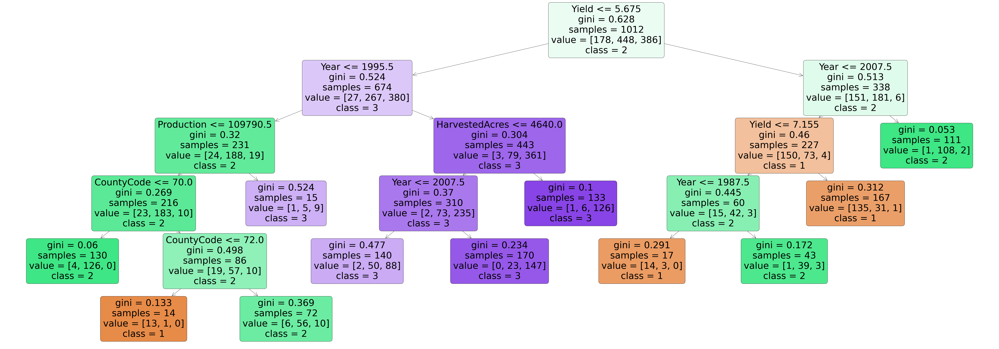

In [224]:
dtc_pt2 = DecisionTreeClassifier(max_leaf_nodes = 11, min_samples_leaf = 6)
dtc_pt2.fit(x_train, y_train)
Plotter(dtc_pt2)

In [225]:
# Prediction on Testing Data
y_pred_dtc_pt = dtc_pt.predict(x_test)
dtc_pt_accuracy = metrics.accuracy_score(y_test, y_pred_dtc_pt)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_dtc_pt))

Accuracy: 0.8188976377952756


In [226]:
# Prediction on Training Data
y_pred2_dtc_pt = dtc_pt.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_dtc_pt))

Accuracy: 0.8507905138339921


In [227]:
confusion_matrix_dtc_pt = metrics.confusion_matrix(y_test, y_pred_dtc_pt)
confusion_matrix_dtc_pt

array([[ 29,   5,   1],
       [ 11,  75,  23],
       [  0,   6, 104]], dtype=int64)

In [228]:
# cm_df = pd.DataFrame(confusion_matrix_dtc_pt)
# sns.heatmap(cm_df, annot=True, fmt="d")
# plt.tight_layout()

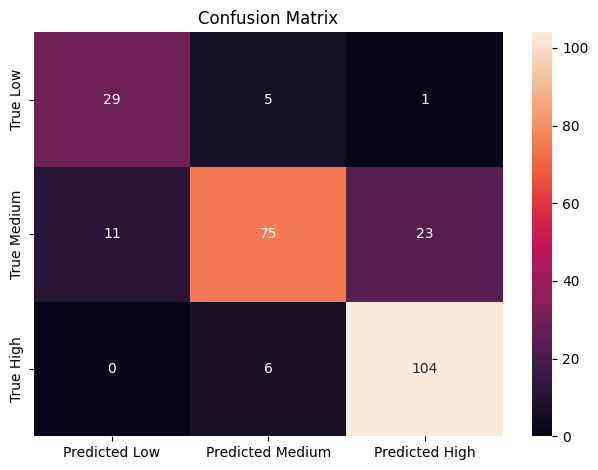

In [229]:
Confusion_Matrix_Plotter(confusion_matrix_dtc_pt, 1)

In [230]:
confusion_matrix_dtc_pt_percent = confusion_matrix_dtc_pt.astype('float') / confusion_matrix_dtc_pt.sum(axis=1)[:, np.newaxis]
confusion_matrix_dtc_pt_percent

array([[0.82857143, 0.14285714, 0.02857143],
       [0.10091743, 0.68807339, 0.21100917],
       [0.        , 0.05454545, 0.94545455]])

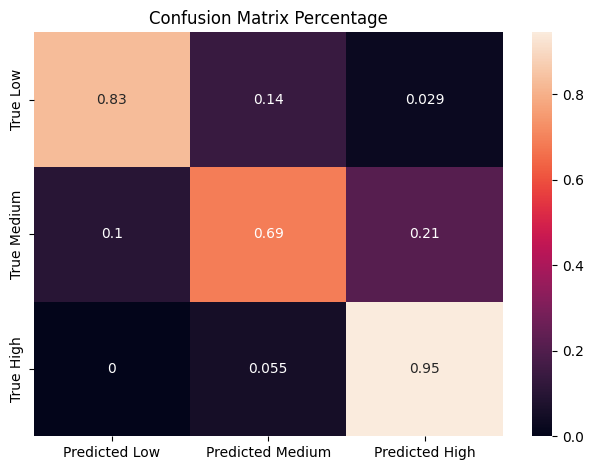

In [231]:
Confusion_Matrix_Plotter(confusion_matrix_dtc_pt_percent, 0)

In [232]:
print(classification_report(y_test, y_pred_dtc_pt, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.72      0.83      0.77        35
Medium Price       0.87      0.69      0.77       109
  High Price       0.81      0.95      0.87       110

    accuracy                           0.82       254
   macro avg       0.80      0.82      0.81       254
weighted avg       0.83      0.82      0.82       254



In [233]:
dt_t1_l, dt_t2_l, dt_t1_m, dt_t2_m, dt_t1_h, dt_t2_h = Compute_Error(confusion_matrix_dtc_pt)

Type1_Error_LowPrice: 11
Type2_Error_LowPrice: 6
Type1_Error_MediumPrice: 11
Type2_Error_MediumPrice: 34
Type1_Error_HighPrice: 24
Type2_Error_HighPrice: 6


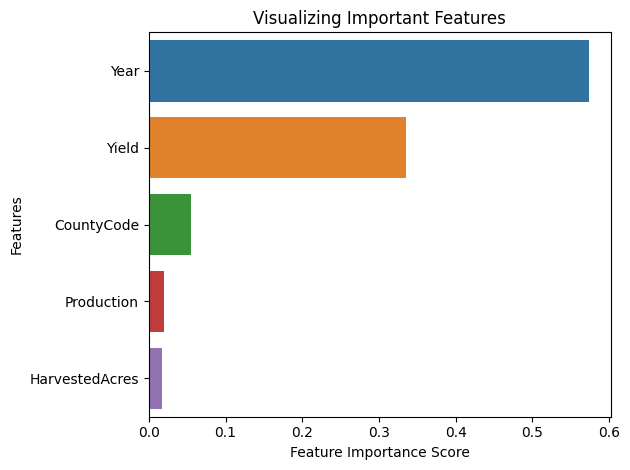

In [234]:
feature_importance = pd.Series(dtc_pt2.feature_importances_, index = x_test.columns).sort_values(ascending = False)

sns.barplot(x = feature_importance, y = feature_importance.index)
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Visualizing Important Features")
plt.tight_layout()

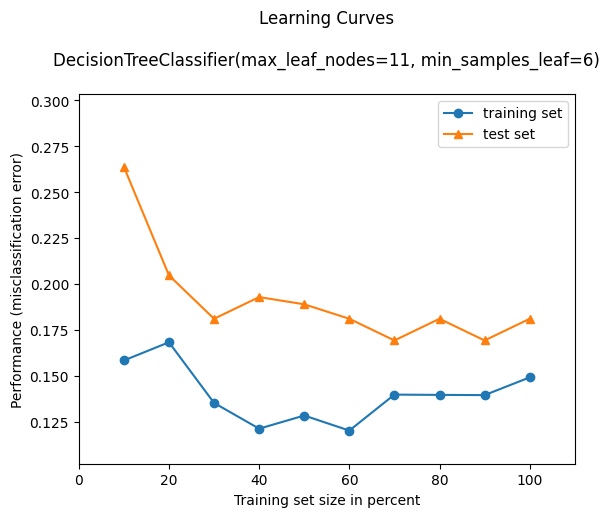

In [235]:
plot_learning_curves(x_train, y_train, x_test, y_test, dtc_pt2) #dtc_pt2 dt_gscv
plt.show()

### Random Forest

<b>Training a Random Forest with the best parameter max_leaf_nodes using RandomForestClassifier()</b>

In [236]:
rfc = RandomForestClassifier(max_leaf_nodes = 11, n_estimators = 100)
rfc.fit(x_train, y_train)

RandomForestClassifier(max_leaf_nodes=11)

In [237]:
# Model Scores on training and test set
print("Training Set score:", rfc.score(x_train, y_train))
print("Test Set score:", rfc.score(x_test, y_test))

Training Set score: 0.8547430830039525
Test Set score: 0.84251968503937


In [238]:
# Prediction on Testing Data
y_pred_rfc = rfc.predict(x_test)
rfc_accuracy = metrics.accuracy_score(y_test, y_pred_rfc)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_rfc))

Accuracy: 0.84251968503937


In [239]:
# Prediction on Training Data
y_pred2_rfc = rfc.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_rfc))

Accuracy: 0.8547430830039525


In [240]:
confusion_matrix_rfc = metrics.confusion_matrix(y_test, y_pred_rfc)
confusion_matrix_rfc

array([[ 27,   7,   1],
       [  6,  85,  18],
       [  0,   8, 102]], dtype=int64)

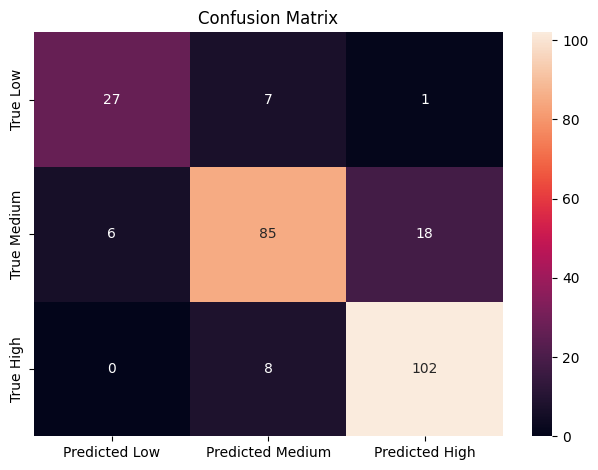

In [241]:
Confusion_Matrix_Plotter(confusion_matrix_rfc, 1)

In [242]:
confusion_matrix_rfc_percent = confusion_matrix_rfc.astype('float') / confusion_matrix_rfc.sum(axis=1)[:, np.newaxis]
confusion_matrix_rfc_percent

array([[0.77142857, 0.2       , 0.02857143],
       [0.05504587, 0.77981651, 0.16513761],
       [0.        , 0.07272727, 0.92727273]])

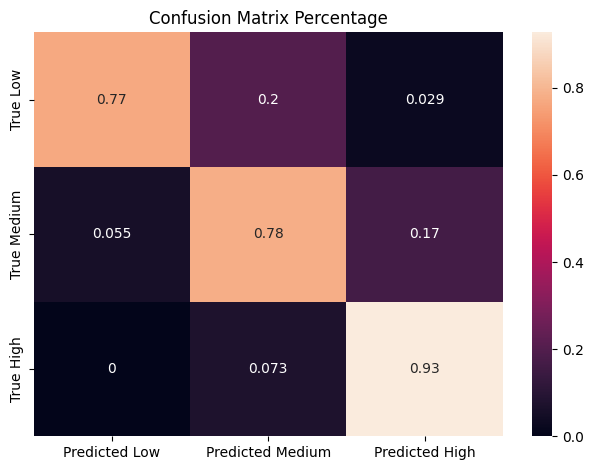

In [243]:
Confusion_Matrix_Plotter(confusion_matrix_rfc_percent, 0)

In [244]:
print(classification_report(y_test, y_pred_rfc, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.82      0.77      0.79        35
Medium Price       0.85      0.78      0.81       109
  High Price       0.84      0.93      0.88       110

    accuracy                           0.84       254
   macro avg       0.84      0.83      0.83       254
weighted avg       0.84      0.84      0.84       254



In [245]:
rfc_t1_l, rfc_t2_l, rfc_t1_m, rfc_t2_m, rfc_t1_h, rfc_t2_h = Compute_Error(confusion_matrix_rfc)

Type1_Error_LowPrice: 6
Type2_Error_LowPrice: 8
Type1_Error_MediumPrice: 15
Type2_Error_MediumPrice: 24
Type1_Error_HighPrice: 19
Type2_Error_HighPrice: 8


In [246]:
cross_val_score(rfc, x_train, y_train, cv = 10, scoring='accuracy')

array([0.85294118, 0.7745098 , 0.78217822, 0.89108911, 0.83168317,
       0.83168317, 0.82178218, 0.82178218, 0.84158416, 0.82178218])

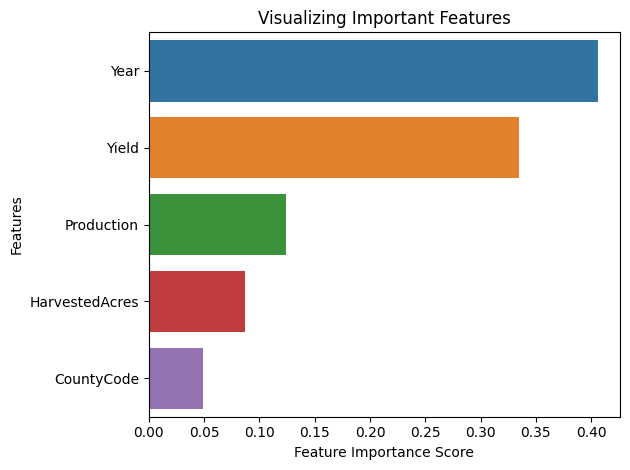

In [247]:
feature_importance = pd.Series(rfc.feature_importances_, index = x_test.columns).sort_values(ascending = False)

sns.barplot(x = feature_importance, y = feature_importance.index)
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Visualizing Important Features")
plt.tight_layout()

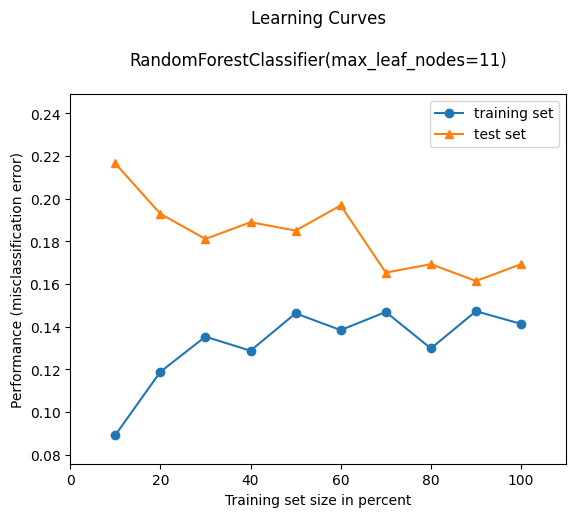

In [248]:
plot_learning_curves(x_train, y_train, x_test, y_test, rfc)
plt.show()

### Random Forest with Randomized Search CV

In [249]:
rfc.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': 11,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [250]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
n_estimators

[200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]

In [251]:
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
max_depth

[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None]

In [252]:
leaf_nodes_list = list(range(1, 16))

In [253]:
random_grid = {'n_estimators': n_estimators, 'max_features': ['auto', 'sqrt'],
               'max_depth': max_depth, 'max_leaf_nodes': leaf_nodes_list,
               'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 3, 4, 5, 6], 'bootstrap': [True, False]}

In [254]:
rfc_rscv = RandomizedSearchCV(estimator = RandomForestClassifier(), param_distributions = random_grid, cv = 10, 
                              verbose=2, n_jobs = -1)

In [255]:
rfc_rscv.fit(x_train, y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'max_leaf_nodes': [1, 2, 3, 4, 5, 6, 7,
                                                           8, 9, 10, 11, 12, 13,
                                                           14, 15],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   verbose=2)

In [256]:
print("GridSearch CV Best Parameters:", rfc_rscv.best_params_) 

print("\nGridSearch CV Best Estimator:", rfc_rscv.best_estimator_)

print("\nGridSearch CV Best score:", rfc_rscv.best_score_)

GridSearch CV Best Parameters: {'n_estimators': 1000, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_leaf_nodes': 14, 'max_features': 'sqrt', 'max_depth': 70, 'bootstrap': True}

GridSearch CV Best Estimator: RandomForestClassifier(max_depth=70, max_leaf_nodes=14, min_samples_leaf=4,
                       n_estimators=1000)

GridSearch CV Best score: 0.834032226752087


In [257]:
# Model Scores on training and test set
print("Training Set score:", rfc_rscv.score(x_train, y_train))
print("Test Set score:", rfc_rscv.score(x_test, y_test))

Training Set score: 0.8616600790513834
Test Set score: 0.8267716535433071


In [258]:
# Prediction on Testing Data
y_pred_rfc_rscv = rfc_rscv.predict(x_test)
rfc_rscv_accuracy = metrics.accuracy_score(y_test, y_pred_rfc_rscv)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_rfc_rscv))

Accuracy: 0.8267716535433071


In [259]:
# Prediction on Training Data
y_pred2_rfc_rscv = rfc_rscv.predict(x_train)
print("Accuracy:", metrics.accuracy_score(y_train, y_pred2_rfc_rscv))

Accuracy: 0.8616600790513834


In [260]:
confusion_matrix_rfc_rscv = metrics.confusion_matrix(y_test, y_pred_rfc_rscv)
confusion_matrix_rfc_rscv

array([[ 27,   7,   1],
       [  8,  82,  19],
       [  0,   9, 101]], dtype=int64)

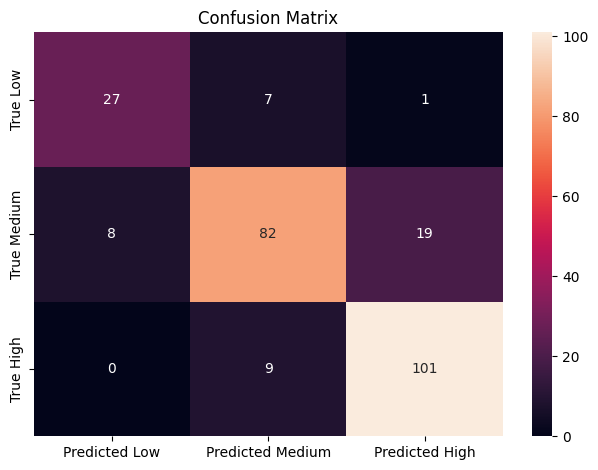

In [261]:
Confusion_Matrix_Plotter(confusion_matrix_rfc_rscv, 1)

In [262]:
confusion_matrix_rfc_rscv_percent = confusion_matrix_rfc_rscv.astype('float') / confusion_matrix_rfc_rscv.sum(axis=1)[:, np.newaxis]
confusion_matrix_rfc_rscv_percent

array([[0.77142857, 0.2       , 0.02857143],
       [0.0733945 , 0.75229358, 0.17431193],
       [0.        , 0.08181818, 0.91818182]])

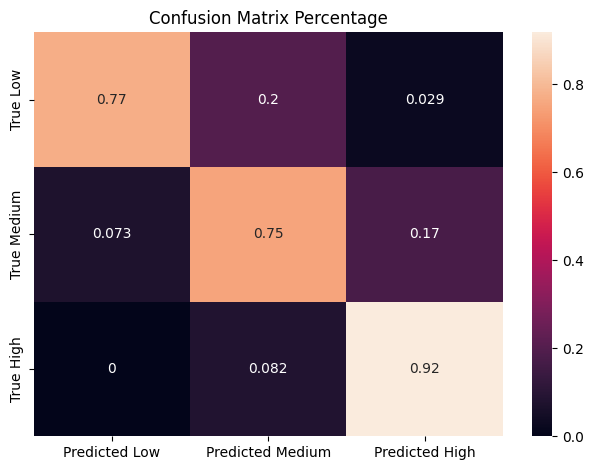

In [263]:
Confusion_Matrix_Plotter(confusion_matrix_rfc_rscv_percent, 0)

In [264]:
print(classification_report(y_test, y_pred_rfc_rscv, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.77      0.77      0.77        35
Medium Price       0.84      0.75      0.79       109
  High Price       0.83      0.92      0.87       110

    accuracy                           0.83       254
   macro avg       0.81      0.81      0.81       254
weighted avg       0.83      0.83      0.82       254



In [265]:
rfc_rscv_t1_l, rfc_rscv_t2_l, rfc_rscv_t1_m, rfc_rscv_t2_m, rfc_rscv_t1_h, rfc_rscv_t2_h = Compute_Error(confusion_matrix_rfc_rscv)

Type1_Error_LowPrice: 8
Type2_Error_LowPrice: 8
Type1_Error_MediumPrice: 16
Type2_Error_MediumPrice: 27
Type1_Error_HighPrice: 20
Type2_Error_HighPrice: 9


In [266]:
rfc2 = RandomForestClassifier(max_leaf_nodes=14, min_samples_leaf=5, min_samples_split=10, n_estimators=400)
rfc2.fit(x_train, y_train)

RandomForestClassifier(max_leaf_nodes=14, min_samples_leaf=5,
                       min_samples_split=10, n_estimators=400)

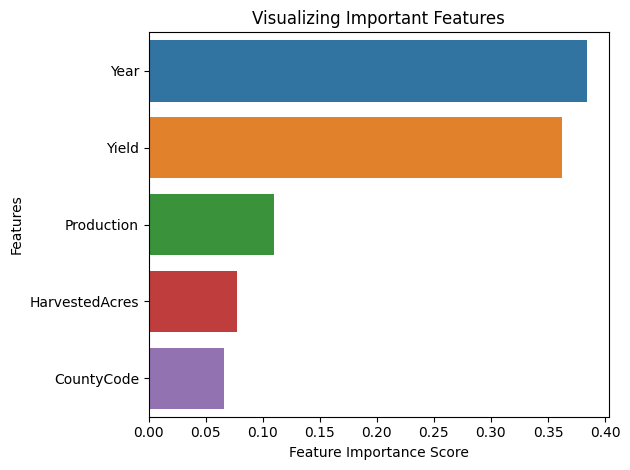

In [267]:
feature_importance = pd.Series(rfc2.feature_importances_, index = x_test.columns).sort_values(ascending = False)

sns.barplot(x = feature_importance, y = feature_importance.index)
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Visualizing Important Features")
plt.tight_layout()

### Artificial Neural Networks 

hidden_layer_sizes : This parameter allows us to set the number of layers and the number of nodes we wish to have in the Neural Network Classifier. Each element in the tuple represents the number of nodes at the ith position where i is the index of the tuple. Thus the length of tuple denotes the total number of hidden layers in the network.

In [268]:
mlp = MLPClassifier(solver='adam', activation='logistic', hidden_layer_sizes=(50, 10, 2), alpha=1e-06, max_iter=5000)

In [269]:
mlp.fit(x_train, y_train)

MLPClassifier(activation='logistic', alpha=1e-06,
              hidden_layer_sizes=(50, 10, 2), max_iter=5000)

In [270]:
# Prediction on Testing Data
y_pred_mlp = mlp.predict(x_test)

In [271]:
# Mean accuracy on the given test data and label
mlp.score(x_test, y_pred_mlp)

1.0

In [272]:
y_pred_mlp

array([2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 1, 2,
       1, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2,
       2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 1, 2, 1, 2, 2,
       1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2,
       1, 2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2,
       1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2,
       2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2,
       2, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 1, 2, 2, 2,
       2, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1], dtype=int64)

In [273]:
print("Number of layers:", mlp.n_layers_)
print("Number of iterations the solver has run:", mlp.n_iter_)
print("Computed Loss:", mlp.loss_)
print("Minimum loss reached by the solver throughout fitting:", mlp.best_loss_)
print("Number of features seen during fit:", mlp.n_features_in_)
print("Output activation function:", mlp.out_activation_) #logistic sigmoid function: returns f(x) = 1 / (1 + exp(-x)).

Number of layers: 5
Number of iterations the solver has run: 224
Computed Loss: 0.8909594172039487
Minimum loss reached by the solver throughout fitting: 0.8704119464683038
Number of features seen during fit: 5
Output activation function: softmax


In [274]:
confusion_matrix_mlp = metrics.confusion_matrix(y_test, y_pred_mlp)
confusion_matrix_mlp

array([[  0,  31,   4],
       [  0,  40,  69],
       [  0,   4, 106]], dtype=int64)

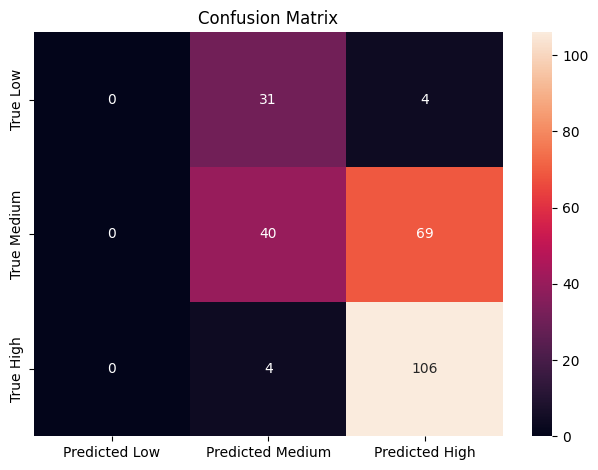

In [275]:
Confusion_Matrix_Plotter(confusion_matrix_mlp, 1)

In [276]:
confusion_matrix_mlp_percent = confusion_matrix_mlp.astype('float') / confusion_matrix_mlp.sum(axis=1)[:, np.newaxis]
confusion_matrix_mlp_percent

array([[0.        , 0.88571429, 0.11428571],
       [0.        , 0.36697248, 0.63302752],
       [0.        , 0.03636364, 0.96363636]])

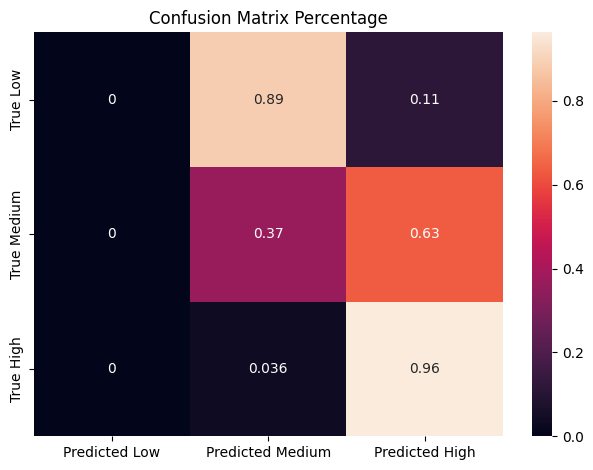

In [277]:
Confusion_Matrix_Plotter(confusion_matrix_mlp_percent, 0)

In [278]:
# Accuracy Score = (TP + TN)/ (TP + FN + TN + FP) 
mlp_accuracy = metrics.accuracy_score(y_test, y_pred_mlp)
print("Accuracy:", mlp_accuracy)

Accuracy: 0.5748031496062992


In [279]:
print(classification_report(y_test, y_pred_mlp, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.00      0.00      0.00        35
Medium Price       0.53      0.37      0.43       109
  High Price       0.59      0.96      0.73       110

    accuracy                           0.57       254
   macro avg       0.38      0.44      0.39       254
weighted avg       0.49      0.57      0.50       254



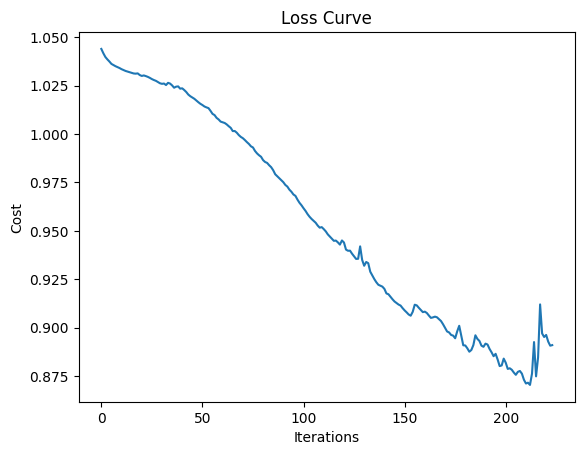

In [280]:
plt.plot(mlp.loss_curve_)
plt.title("Loss Curve")
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.show()

<b>Neural Network with a different network structure</b>

In [281]:
mlp2 = MLPClassifier(solver='adam', activation='logistic', hidden_layer_sizes=(500, 100), alpha=1e-08, max_iter=5000)
mlp2.fit(x_train, y_train)

MLPClassifier(activation='logistic', alpha=1e-08, hidden_layer_sizes=(500, 100),
              max_iter=5000)

In [282]:
y_pred_mlp2 = mlp2.predict(x_test)

In [283]:
# Mean accuracy on the given test data and label
mlp2.score(x_test, y_pred_mlp2)

1.0

In [284]:
y_pred_mlp2

array([2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 2,
       1, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2, 2, 0, 2, 2, 2, 1, 1, 2, 1, 2,
       1, 2, 2, 1, 2, 1, 1, 2, 1, 2, 2, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2,
       1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 2,
       1, 1, 0, 2, 1, 1, 1, 2, 2, 2, 1, 2, 2, 1, 1, 2, 2, 2, 2, 1, 1, 2,
       1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2, 2,
       2, 2, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2,
       2, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 0, 2, 1, 2, 2, 1,
       2, 1, 1, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1], dtype=int64)

In [285]:
print("Number of layers:", mlp2.n_layers_)
print("Number of iterations the solver has run:", mlp2.n_iter_)
print("Computed Loss:", mlp2.loss_)
print("Minimum loss reached by the solver throughout fitting:", mlp2.best_loss_)
print("Number of features seen during fit:", mlp2.n_features_in_)
print("Output activation function:", mlp2.out_activation_)

Number of layers: 4
Number of iterations the solver has run: 39
Computed Loss: 0.8066446344169427
Minimum loss reached by the solver throughout fitting: 0.786258060595176
Number of features seen during fit: 5
Output activation function: softmax


In [286]:
confusion_matrix_mlp2 = metrics.confusion_matrix(y_test, y_pred_mlp2)
confusion_matrix_mlp2

array([[ 0, 32,  3],
       [ 3, 52, 54],
       [ 0, 12, 98]], dtype=int64)

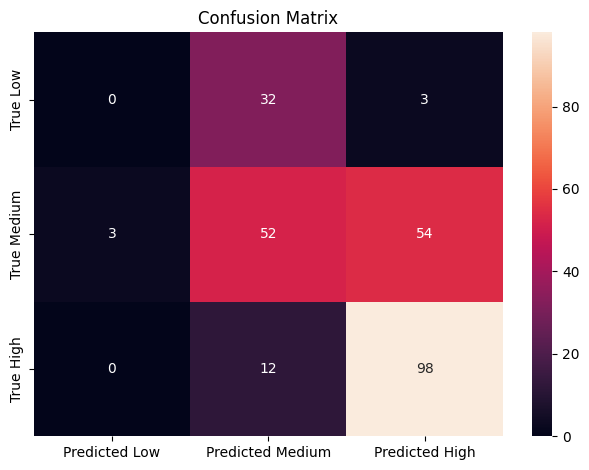

In [287]:
Confusion_Matrix_Plotter(confusion_matrix_mlp2, 1)

In [288]:
confusion_matrix_mlp2_percent = confusion_matrix_mlp2.astype('float') / confusion_matrix_mlp2.sum(axis=1)[:, np.newaxis]
confusion_matrix_mlp2_percent

array([[0.        , 0.91428571, 0.08571429],
       [0.02752294, 0.47706422, 0.49541284],
       [0.        , 0.10909091, 0.89090909]])

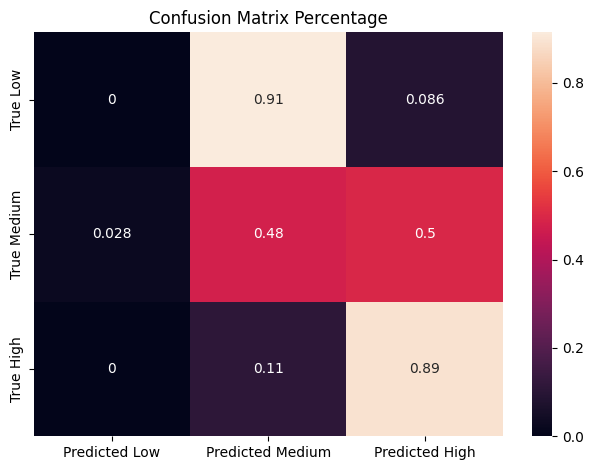

In [289]:
Confusion_Matrix_Plotter(confusion_matrix_mlp2_percent, 0)

In [290]:
# Accuracy Score = (TP + TN)/ (TP + FN + TN + FP) 
mlp2_accuracy = metrics.accuracy_score(y_test, y_pred_mlp2)
print("Accuracy:", mlp2_accuracy)

Accuracy: 0.5905511811023622


In [291]:
print(classification_report(y_test, y_pred_mlp2, target_names=["Low Price", "Medium Price", "High Price"]))

              precision    recall  f1-score   support

   Low Price       0.00      0.00      0.00        35
Medium Price       0.54      0.48      0.51       109
  High Price       0.63      0.89      0.74       110

    accuracy                           0.59       254
   macro avg       0.39      0.46      0.42       254
weighted avg       0.51      0.59      0.54       254



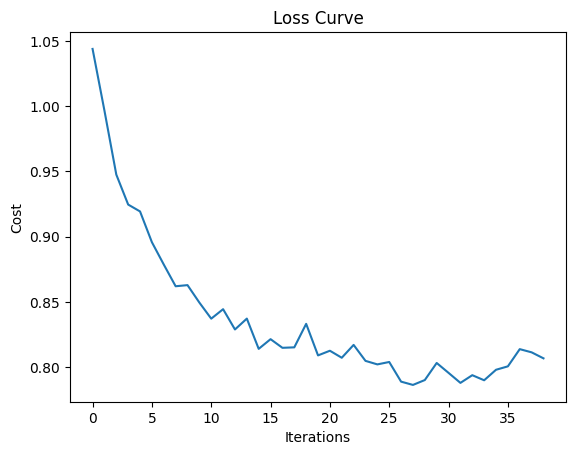

In [292]:
plt.plot(mlp2.loss_curve_)
plt.title("Loss Curve")
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.show()

In [293]:
improvement_mlp = mlp2_accuracy - mlp_accuracy
improvement_mlp * 100

1.5748031496062964

## Comparing Performance of Various Models

In [ ]:
models_error = [('Logistic Regression', tp_lr, fp_lr, tn_lr, fn_lr, accuracy_lr_train, accuracy_lr_test, cv_lr.mean()),
          ('K-Nearest Neighbors (KNN)', tp_knn, fp_knn, tn_knn, fn_knn, accuracy_knn_train, accuracy_knn_test, cv_knn.mean()),
          ('SVM (Linear)', tp_svm_linear, fp_svm_linear, tn_svm_linear, fn_svm_linear, accuracy_svm_linear_train, accuracy_svm_linear_test, cv_svm_linear.mean()),
          ('SVM (Kernel)', tp_svm_kernel, fp_svm_kernel, tn_svm_kernel, fn_svm_kernel, accuracy_svm_kernel_train, accuracy_svm_kernel_test, cv_svm_kernel.mean()),
          ('Naive Bayes', tp_nb, fp_nb, tn_nb, fn_nb, accuracy_nb_train, accuracy_nb_test, cv_nb.mean()),
          ('Decision Tree Classification', tp_dt, fp_dt, tn_dt, fn_dt, accuracy_dt_train, accuracy_dt_test, cv_dt.mean()),
          ('Random Forest Tree Classification', tp_rf, fp_rf, tn_rf, fn_rf, accuracy_rf_train, accuracy_rf_test, cv_rf.mean())
         ]

In [ ]:
error_data = pd.DataFrame(data = models_error, columns=['Model', 'Type1 Error Low Price', 'Type2 Error Low Price', 
                                                        'Type1 Error Medium Price', 'Type2 Error Medium Price', 
                                                        'Type1 Error High Price', 'Type2 Error High Price'])
error_data

In [ ]:
models = [('Logistic Regression', tp_lr, fp_lr, tn_lr, fn_lr, accuracy_lr_train, accuracy_lr_test, cv_lr.mean()),
          ('K-Nearest Neighbors (KNN)', tp_knn, fp_knn, tn_knn, fn_knn, accuracy_knn_train, accuracy_knn_test, cv_knn.mean()),
          ('SVM (Linear)', tp_svm_linear, fp_svm_linear, tn_svm_linear, fn_svm_linear, accuracy_svm_linear_train, accuracy_svm_linear_test, cv_svm_linear.mean()),
          ('SVM (Kernel)', tp_svm_kernel, fp_svm_kernel, tn_svm_kernel, fn_svm_kernel, accuracy_svm_kernel_train, accuracy_svm_kernel_test, cv_svm_kernel.mean()),
          ('Naive Bayes', tp_nb, fp_nb, tn_nb, fn_nb, accuracy_nb_train, accuracy_nb_test, cv_nb.mean()),
          ('Decision Tree Classification', tp_dt, fp_dt, tn_dt, fn_dt, accuracy_dt_train, accuracy_dt_test, cv_dt.mean()),
          ('Random Forest Tree Classification', tp_rf, fp_rf, tn_rf, fn_rf, accuracy_rf_train, accuracy_rf_test, cv_rf.mean())
         ]

In [ ]:
performance = pd.DataFrame(data = models, columns=['Model', 'Accuracy(Training Set)', 'Accuracy(Test Set)', 'Cross-Validation'])
performance

In [294]:
models = pd.DataFrame({'Model': ['Decision Tree','Pruned Decision Tree', 'Random Forest', 'Neural Network (50, 10, 2)', 'Neural Network (500,100)'], 
                       'Accuracy': [dtc_accuracy, dtc_pt_accuracy, rfc_accuracy, mlp_accuracy, mlp2_accuracy]})
models.sort_values(by = 'Accuracy', ascending = False)

,Model,Accuracy
0,Decision Tree,0.850394
2,Random Forest,0.842520
1,Pruned Decision Tree,0.818898
4,"Neural Network (500,100)",0.590551
3,"Neural Network (50, 10, 2)",0.574803


In [295]:
print(models)

                        Model  Accuracy
0               Decision Tree  0.850394
1        Pruned Decision Tree  0.818898
2               Random Forest  0.842520
3  Neural Network (50, 10, 2)  0.574803
4    Neural Network (500,100)  0.590551


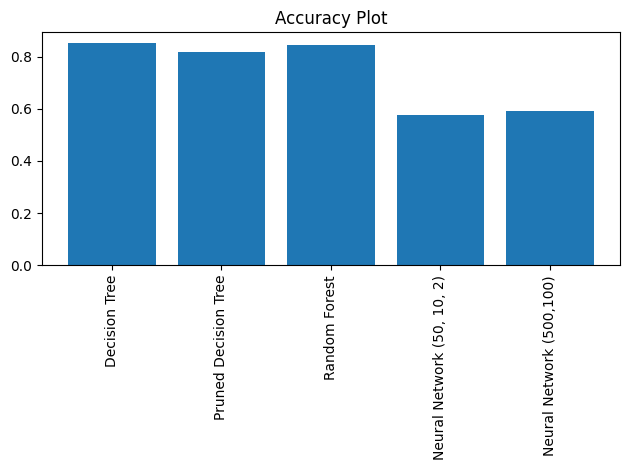

In [296]:
plt.bar(models.Model.tolist(), models.Accuracy.tolist())
plt.xticks(rotation=90)
plt.title("Accuracy Plot")
plt.tight_layout()